In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [2]:
class Generator(nn.Module):
    def __init__(self, z_dim):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 384 * 4 * 4),
            nn.ReLU(True),

            nn.Unflatten(-1, (384, 4, 4)),
            nn.ConvTranspose2d(384, 192, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(192),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(192, 96, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(96),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(96, 3, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

In [3]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(16, 32, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(32, 64, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(64, 128, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(128, 256, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(256, 512, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),

            nn.Flatten(),
            nn.Linear(4*4*512, 1)
        )

    def forward(self, x):
        return self.net(x)

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)
    elif classname.find("Linear") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)

In [5]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  # Random Horizontal Flip Image
    transforms.RandomRotation(10),      # Randomly rotate the image ±10 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Adjust brightness, contrast, saturation and hue randomly
    transforms.RandomResizedCrop(32, scale=(0.8, 1.0)), # Random image cropping
    transforms.ToTensor(), # [0, 255] -> [0, 1]
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # [0, 1] -> [-1, 1]
])
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True, pin_memory=True, persistent_workers=True, prefetch_factor=4, num_workers=8)

Files already downloaded and verified


In [6]:
z_dim = 100
epochs = 1001
clip = 0.01
n_critic = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

generator = Generator(z_dim).to(device)
discriminator = Discriminator().to(device)

generator.apply(weights_init)
discriminator.apply(weights_init)

opt_gen = optim.RMSprop(generator.parameters(), lr=0.00005)
opt_disc = optim.RMSprop(discriminator.parameters(), lr=0.00005)

In [7]:
def plot_losses(loss_disc_arr, loss_gen_arr, eps):
    plt.figure(figsize=(12,4))
    plt.plot(np.arange(0, eps+1), loss_disc_arr, label="disc")
    plt.plot(np.arange(0, eps+1), loss_gen_arr, label="gen")
    plt.xlabel("eps")
    plt.ylabel("loss")
    plt.title("Loss vs Epsilon (eps="+str(eps)+")")
    plt.legend()
    plt.show()

def plot_grads(grad_disc_arr, grad_gen_arr, eps):
    plt.figure(figsize=(12,4))
    plt.plot(np.arange(0, eps+1), grad_disc_arr, label="disc")
    plt.plot(np.arange(0, eps+1), grad_gen_arr, label="gen")
    plt.xlabel("eps")
    plt.ylabel("grad")
    plt.title("Grad vs Epsilon (eps="+str(eps)+")")
    plt.legend()
    plt.show()

Epoch [0/1001] Loss D: -0.04151, Loss G: 0.10316
Epoch [1/1001] Loss D: -0.72894, Loss G: 0.45790
Epoch [2/1001] Loss D: -1.09435, Loss G: 0.52626
Epoch [3/1001] Loss D: -1.00874, Loss G: 0.54296
Epoch [4/1001] Loss D: -1.17185, Loss G: 0.53551
Epoch [5/1001] Loss D: -1.18463, Loss G: 0.58528
Epoch [6/1001] Loss D: -1.18729, Loss G: 0.55836
Epoch [7/1001] Loss D: -1.07984, Loss G: 0.56660
Epoch [8/1001] Loss D: -0.86511, Loss G: 0.38415
Epoch [9/1001] Loss D: -0.61974, Loss G: 0.58606
Epoch [10/1001] Loss D: -0.92796, Loss G: 0.54992
Epoch [11/1001] Loss D: -0.99718, Loss G: 0.34968
Epoch [12/1001] Loss D: -0.78970, Loss G: 0.22159
Epoch [13/1001] Loss D: -0.76755, Loss G: 0.55879
Epoch [14/1001] Loss D: -1.04579, Loss G: 0.46941
Epoch [15/1001] Loss D: -0.47094, Loss G: 0.48956
Epoch [16/1001] Loss D: -0.66599, Loss G: 0.53630
Epoch [17/1001] Loss D: -0.94682, Loss G: 0.43631
Epoch [18/1001] Loss D: -0.91807, Loss G: 0.34976
Epoch [19/1001] Loss D: -0.66933, Loss G: 0.24241
Epoch [20/

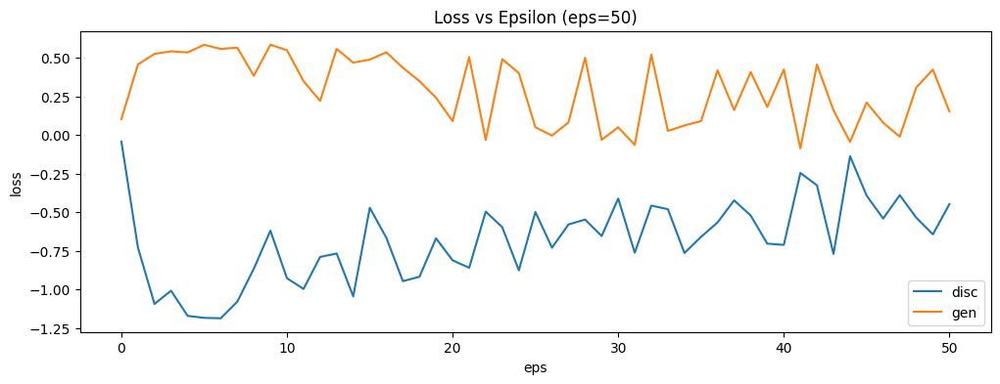

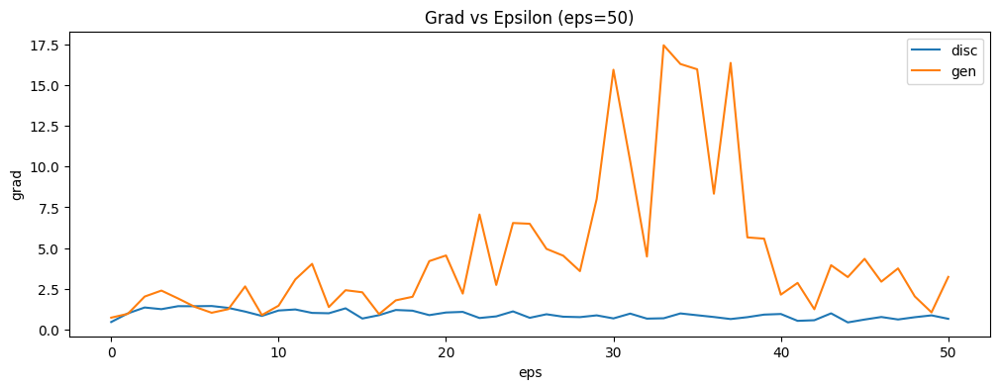

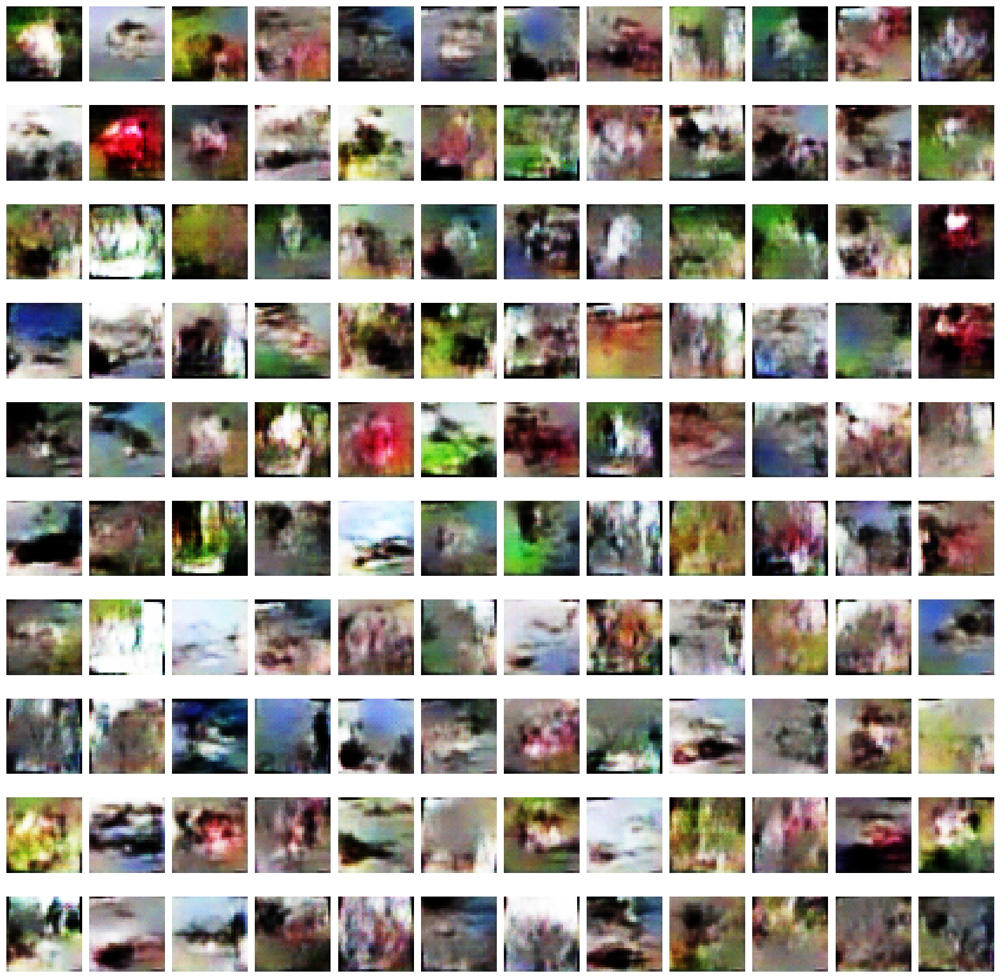

Epoch [51/1001] Loss D: -0.60213, Loss G: 0.35371
Epoch [52/1001] Loss D: -0.46822, Loss G: 0.16306
Epoch [53/1001] Loss D: -0.25185, Loss G: -0.00136
Epoch [54/1001] Loss D: -0.42742, Loss G: -0.03404
Epoch [55/1001] Loss D: -0.40357, Loss G: 0.33476
Epoch [56/1001] Loss D: -0.62124, Loss G: -0.11335
Epoch [57/1001] Loss D: -0.46016, Loss G: 0.32444
Epoch [58/1001] Loss D: -0.26541, Loss G: 0.33973
Epoch [59/1001] Loss D: -0.27479, Loss G: 0.39351
Epoch [60/1001] Loss D: -0.45065, Loss G: 0.27692
Epoch [61/1001] Loss D: -0.27884, Loss G: 0.23255
Epoch [62/1001] Loss D: -0.31784, Loss G: 0.39464
Epoch [63/1001] Loss D: -0.20102, Loss G: 0.11470
Epoch [64/1001] Loss D: -0.34988, Loss G: 0.16967
Epoch [65/1001] Loss D: -0.43838, Loss G: 0.27971
Epoch [66/1001] Loss D: -0.23910, Loss G: 0.28741
Epoch [67/1001] Loss D: -0.48356, Loss G: 0.01359
Epoch [68/1001] Loss D: -0.48076, Loss G: -0.04486
Epoch [69/1001] Loss D: -0.39098, Loss G: 0.32063
Epoch [70/1001] Loss D: -0.41929, Loss G: 0.11

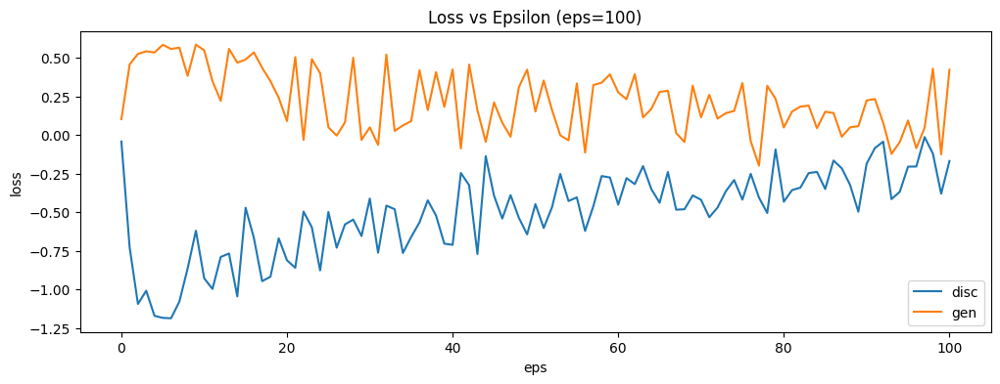

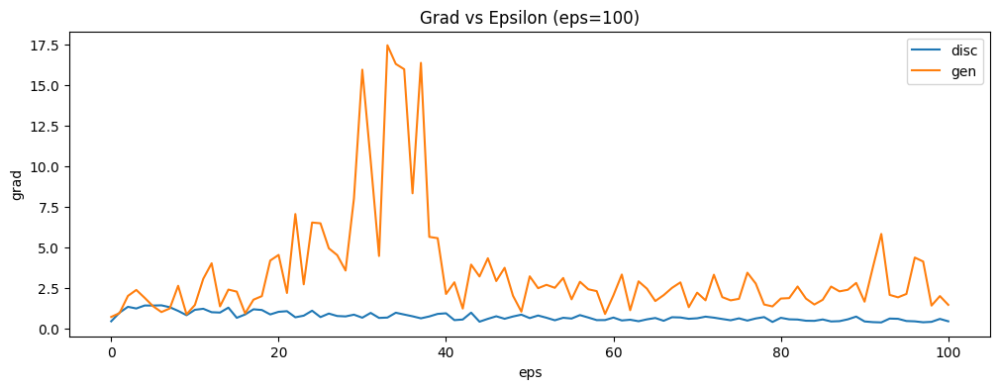

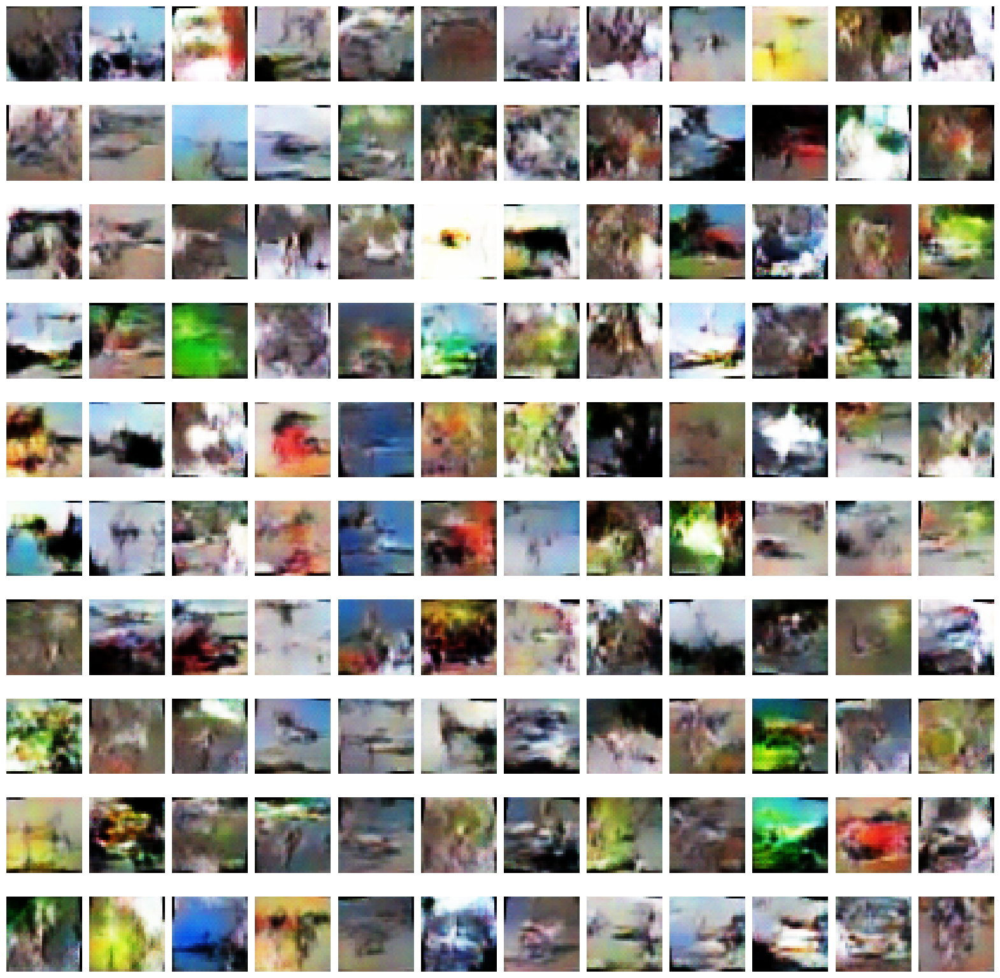

Epoch [101/1001] Loss D: -0.02038, Loss G: -0.02465
Epoch [102/1001] Loss D: -0.23477, Loss G: 0.19070
Epoch [103/1001] Loss D: -0.02784, Loss G: 0.22356
Epoch [104/1001] Loss D: -0.07150, Loss G: -0.07434
Epoch [105/1001] Loss D: -0.05694, Loss G: 0.11702
Epoch [106/1001] Loss D: -0.34351, Loss G: 0.14728
Epoch [107/1001] Loss D: -0.26406, Loss G: 0.24682
Epoch [108/1001] Loss D: -0.35807, Loss G: 0.08314
Epoch [109/1001] Loss D: -0.13862, Loss G: 0.23879
Epoch [110/1001] Loss D: -0.42762, Loss G: 0.27651
Epoch [111/1001] Loss D: 0.15968, Loss G: 0.12214
Epoch [112/1001] Loss D: -0.05969, Loss G: -0.26636
Epoch [113/1001] Loss D: -0.25661, Loss G: 0.38213
Epoch [114/1001] Loss D: -0.24107, Loss G: 0.16081
Epoch [115/1001] Loss D: 0.01386, Loss G: 0.01135
Epoch [116/1001] Loss D: -0.17496, Loss G: -0.09007
Epoch [117/1001] Loss D: -0.36567, Loss G: 0.17455
Epoch [118/1001] Loss D: -0.13678, Loss G: -0.26877
Epoch [119/1001] Loss D: -0.14581, Loss G: 0.01083
Epoch [120/1001] Loss D: -0.

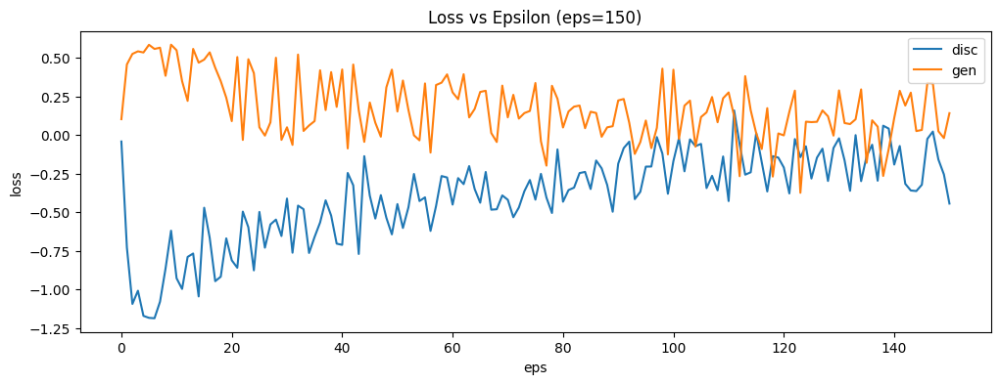

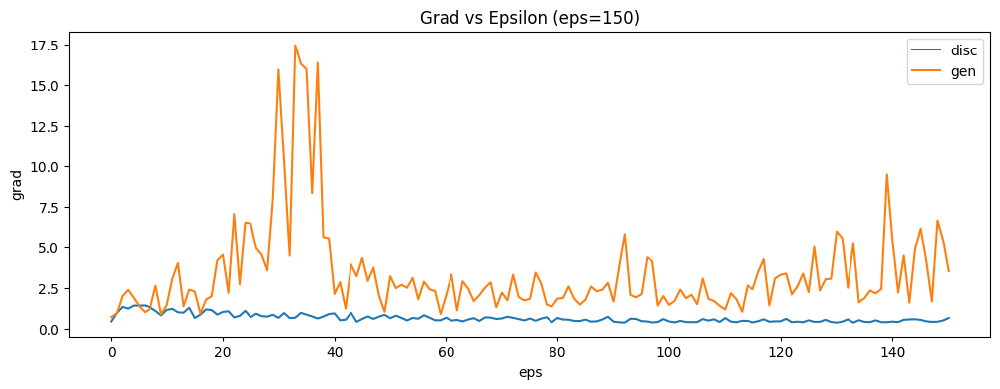

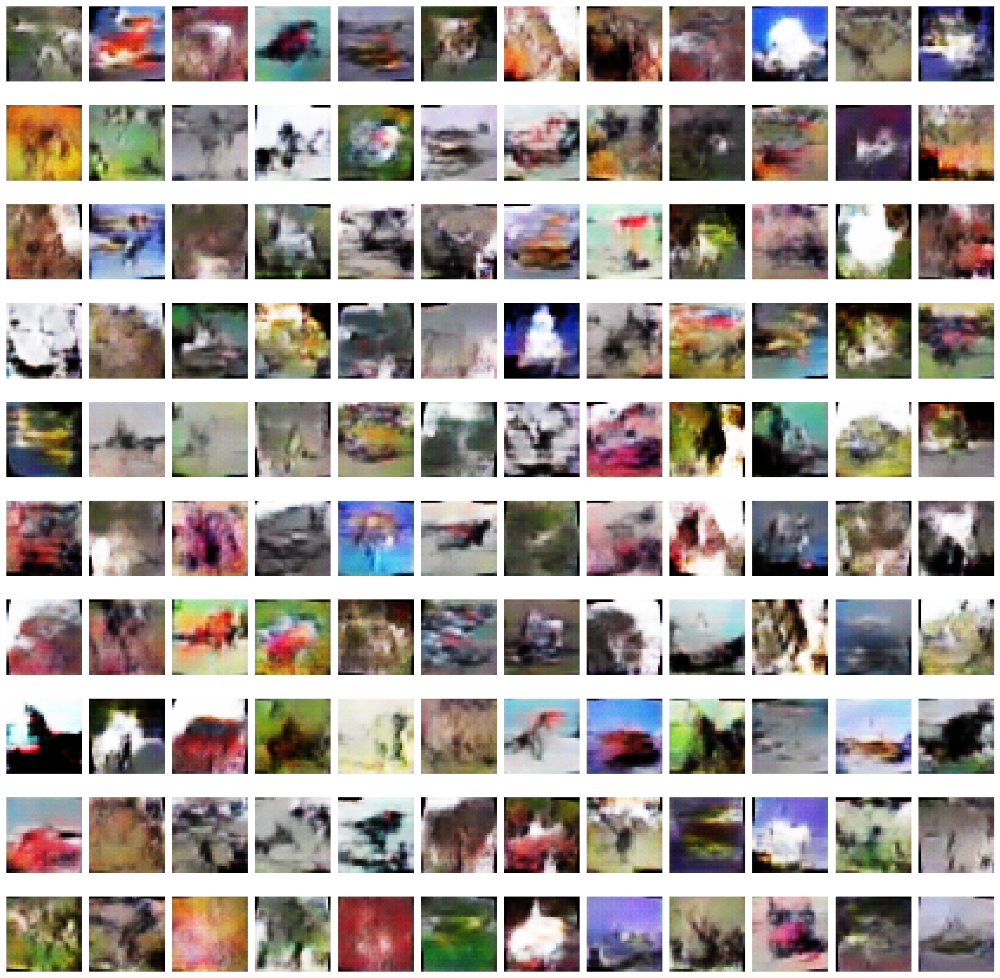

Epoch [151/1001] Loss D: -0.05312, Loss G: 0.22298
Epoch [152/1001] Loss D: 0.12883, Loss G: -0.08248
Epoch [153/1001] Loss D: -0.08202, Loss G: 0.19457
Epoch [154/1001] Loss D: -0.35760, Loss G: -0.01142
Epoch [155/1001] Loss D: 0.07251, Loss G: -0.03842
Epoch [156/1001] Loss D: -0.19488, Loss G: 0.11472
Epoch [157/1001] Loss D: 0.06811, Loss G: 0.33741
Epoch [158/1001] Loss D: -0.20651, Loss G: -0.04456
Epoch [159/1001] Loss D: -0.21516, Loss G: -0.00519
Epoch [160/1001] Loss D: 0.05494, Loss G: 0.07010
Epoch [161/1001] Loss D: -0.05367, Loss G: 0.35053
Epoch [162/1001] Loss D: -0.11749, Loss G: 0.13259
Epoch [163/1001] Loss D: -0.26048, Loss G: 0.23304
Epoch [164/1001] Loss D: -0.18870, Loss G: -0.05244
Epoch [165/1001] Loss D: -0.09313, Loss G: -0.12944
Epoch [166/1001] Loss D: -0.24294, Loss G: -0.23931
Epoch [167/1001] Loss D: 0.07749, Loss G: 0.02511
Epoch [168/1001] Loss D: 0.13837, Loss G: -0.06860
Epoch [169/1001] Loss D: -0.10891, Loss G: -0.11372
Epoch [170/1001] Loss D: -0

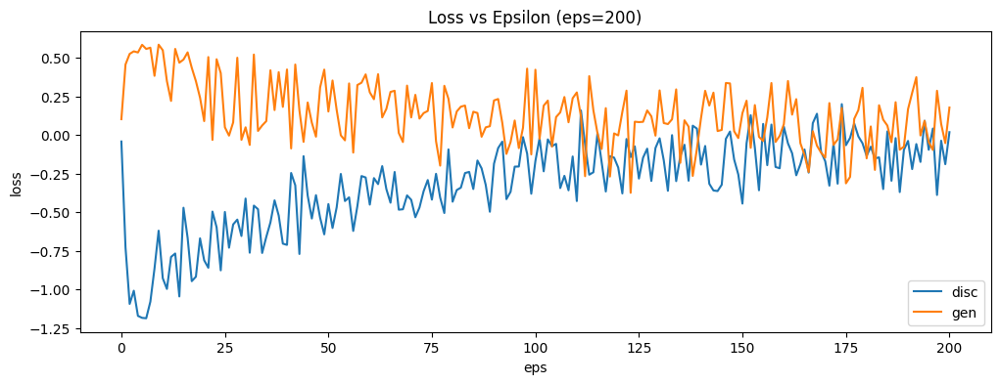

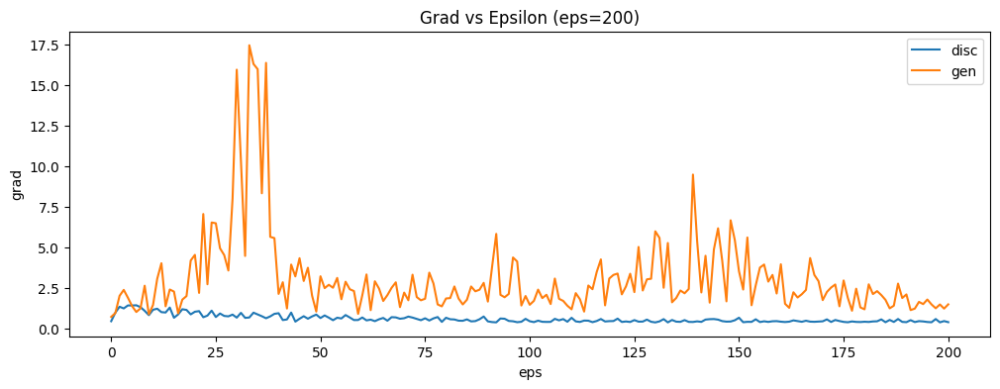

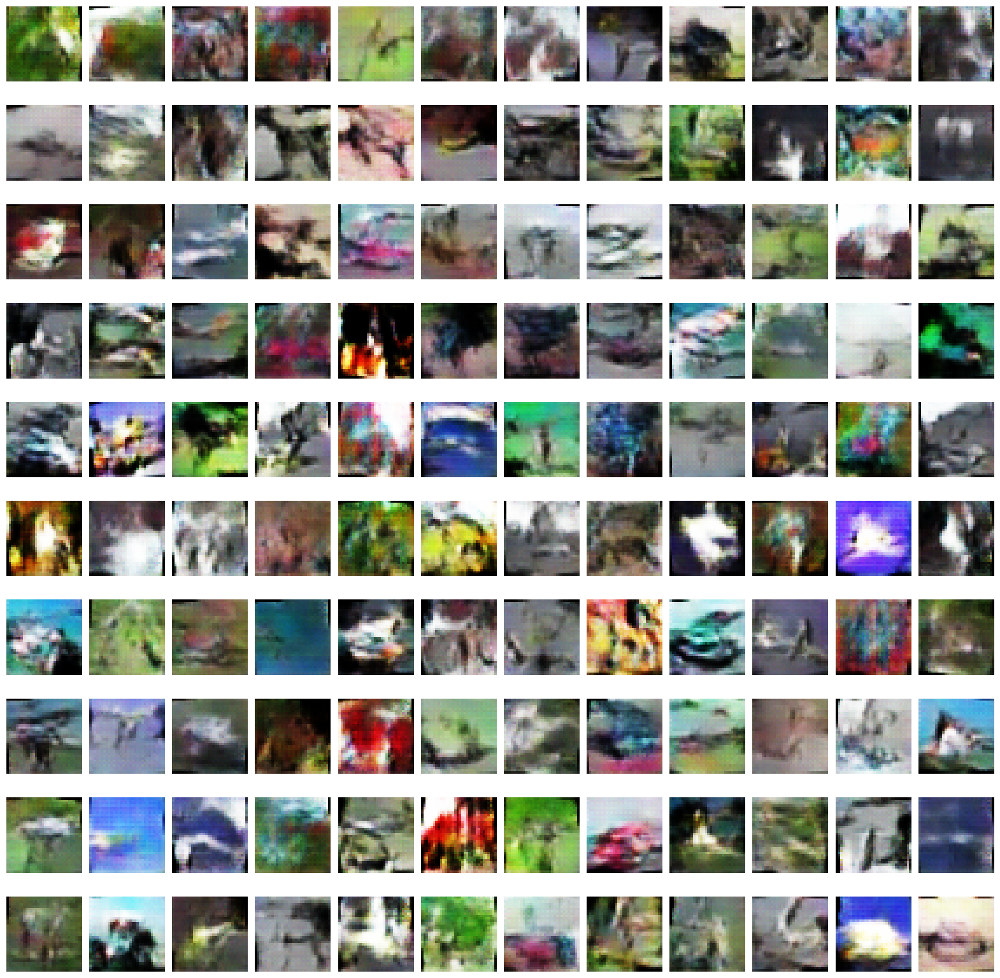

Epoch [201/1001] Loss D: -0.26905, Loss G: 0.06374
Epoch [202/1001] Loss D: -0.05177, Loss G: 0.06278
Epoch [203/1001] Loss D: -0.27305, Loss G: -0.01583
Epoch [204/1001] Loss D: -0.23651, Loss G: 0.15693
Epoch [205/1001] Loss D: -0.10415, Loss G: 0.12545
Epoch [206/1001] Loss D: -0.09324, Loss G: 0.37322
Epoch [207/1001] Loss D: -0.21888, Loss G: 0.03950
Epoch [208/1001] Loss D: -0.29639, Loss G: -0.00376
Epoch [209/1001] Loss D: -0.24285, Loss G: 0.24038
Epoch [210/1001] Loss D: 0.06500, Loss G: 0.08447
Epoch [211/1001] Loss D: -0.16898, Loss G: 0.13057
Epoch [212/1001] Loss D: -0.01660, Loss G: 0.02027
Epoch [213/1001] Loss D: -0.03340, Loss G: 0.20922
Epoch [214/1001] Loss D: -0.16848, Loss G: 0.42828
Epoch [215/1001] Loss D: -0.30151, Loss G: 0.29798
Epoch [216/1001] Loss D: -0.09068, Loss G: 0.39690
Epoch [217/1001] Loss D: -0.09029, Loss G: -0.03309
Epoch [218/1001] Loss D: -0.16192, Loss G: -0.18624
Epoch [219/1001] Loss D: -0.03380, Loss G: -0.27834
Epoch [220/1001] Loss D: 0.

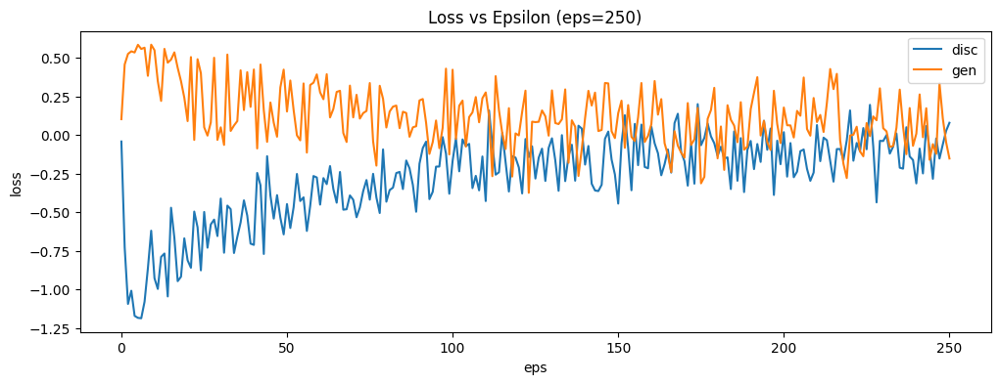

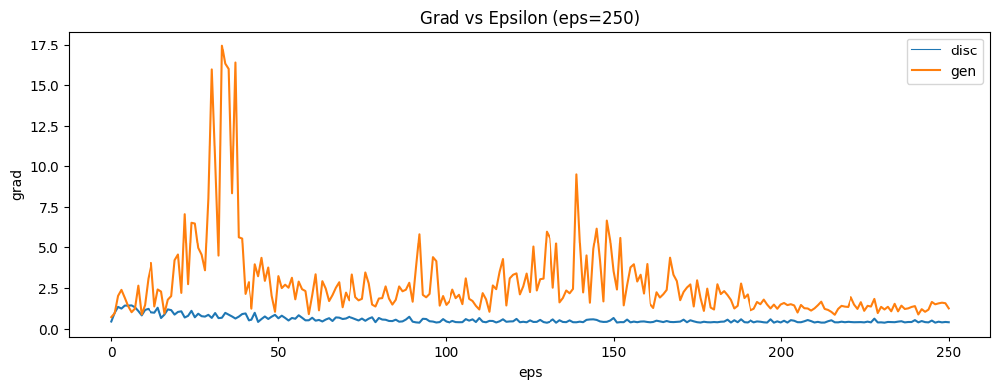

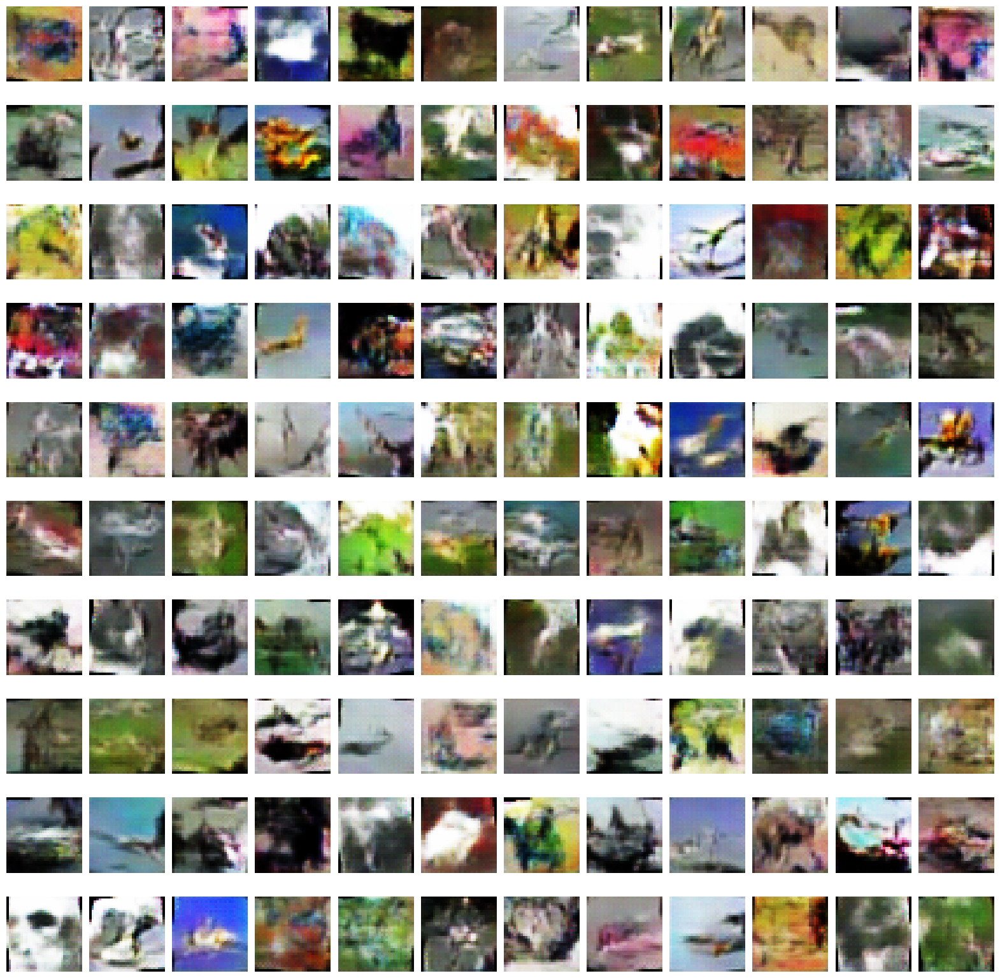

Epoch [251/1001] Loss D: 0.07430, Loss G: 0.00061
Epoch [252/1001] Loss D: -0.02556, Loss G: 0.39406
Epoch [253/1001] Loss D: -0.04542, Loss G: 0.03646
Epoch [254/1001] Loss D: 0.20916, Loss G: 0.18902
Epoch [255/1001] Loss D: 0.04143, Loss G: -0.05037
Epoch [256/1001] Loss D: -0.01117, Loss G: -0.01047
Epoch [257/1001] Loss D: -0.22047, Loss G: 0.13330
Epoch [258/1001] Loss D: -0.15489, Loss G: 0.17333
Epoch [259/1001] Loss D: -0.22634, Loss G: 0.16701
Epoch [260/1001] Loss D: 0.01781, Loss G: 0.09915
Epoch [261/1001] Loss D: -0.41730, Loss G: 0.09452
Epoch [262/1001] Loss D: -0.14439, Loss G: 0.11742
Epoch [263/1001] Loss D: -0.01191, Loss G: -0.01772
Epoch [264/1001] Loss D: -0.12578, Loss G: 0.15545
Epoch [265/1001] Loss D: -0.06599, Loss G: 0.20108
Epoch [266/1001] Loss D: -0.40180, Loss G: 0.11021
Epoch [267/1001] Loss D: -0.06112, Loss G: 0.08974
Epoch [268/1001] Loss D: -0.03572, Loss G: -0.16060
Epoch [269/1001] Loss D: -0.32069, Loss G: 0.25245
Epoch [270/1001] Loss D: -0.097

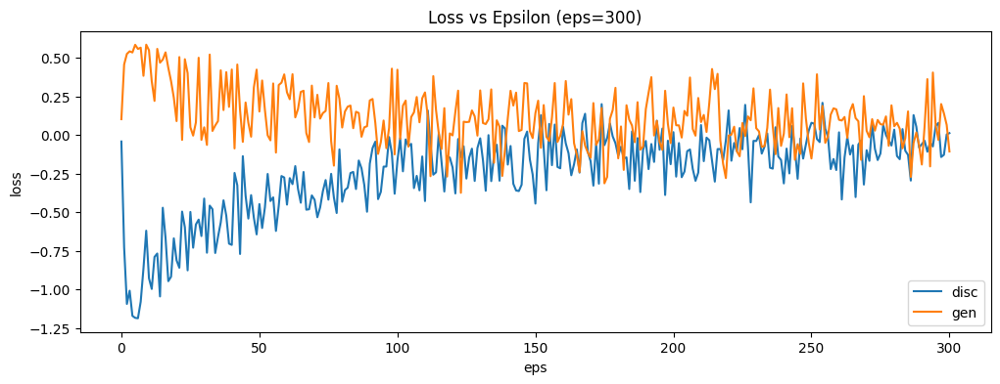

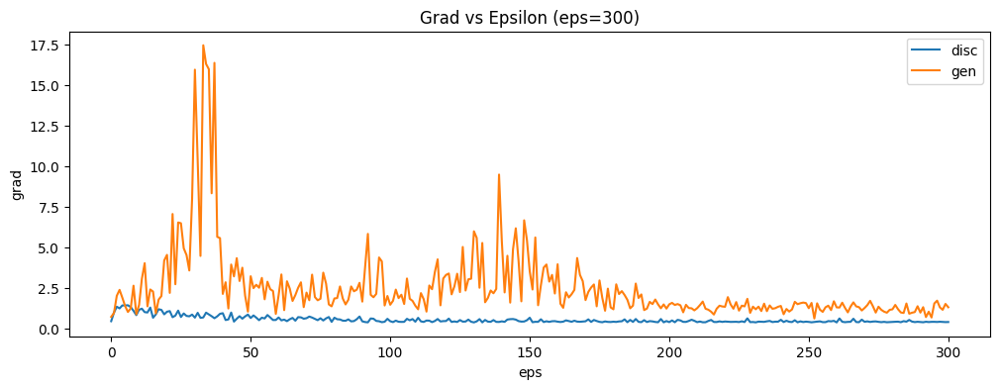

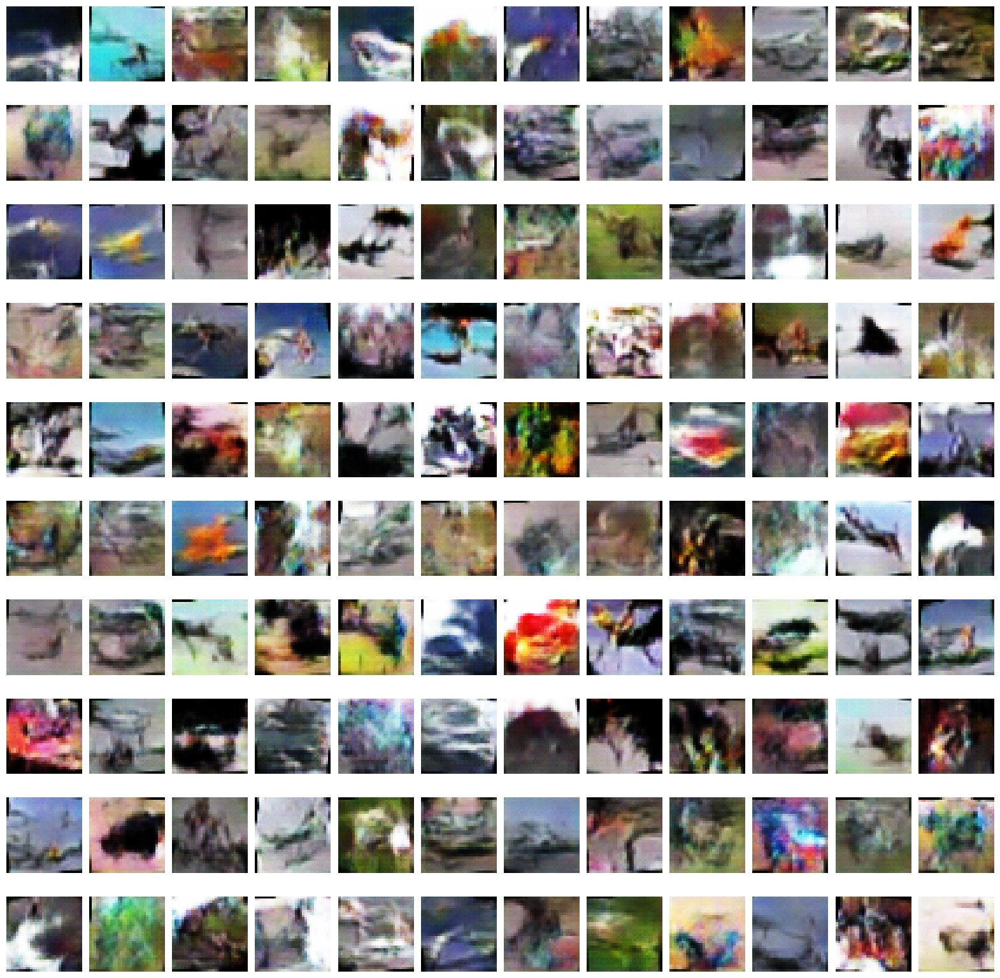

Epoch [301/1001] Loss D: -0.16560, Loss G: -0.13710
Epoch [302/1001] Loss D: -0.08582, Loss G: 0.08249
Epoch [303/1001] Loss D: -0.25776, Loss G: -0.16536
Epoch [304/1001] Loss D: 0.00762, Loss G: -0.01571
Epoch [305/1001] Loss D: 0.13687, Loss G: -0.10638
Epoch [306/1001] Loss D: 0.10908, Loss G: 0.25997
Epoch [307/1001] Loss D: -0.04901, Loss G: 0.11961
Epoch [308/1001] Loss D: -0.03861, Loss G: -0.14643
Epoch [309/1001] Loss D: -0.08369, Loss G: -0.21243
Epoch [310/1001] Loss D: -0.05615, Loss G: 0.25949
Epoch [311/1001] Loss D: 0.01766, Loss G: -0.03106
Epoch [312/1001] Loss D: 0.00442, Loss G: 0.24248
Epoch [313/1001] Loss D: -0.18962, Loss G: 0.01424
Epoch [314/1001] Loss D: -0.06272, Loss G: 0.14119
Epoch [315/1001] Loss D: -0.30053, Loss G: 0.10324
Epoch [316/1001] Loss D: 0.09107, Loss G: 0.17941
Epoch [317/1001] Loss D: -0.22157, Loss G: 0.11073
Epoch [318/1001] Loss D: -0.08617, Loss G: 0.18827
Epoch [319/1001] Loss D: -0.07275, Loss G: 0.00486
Epoch [320/1001] Loss D: -0.13

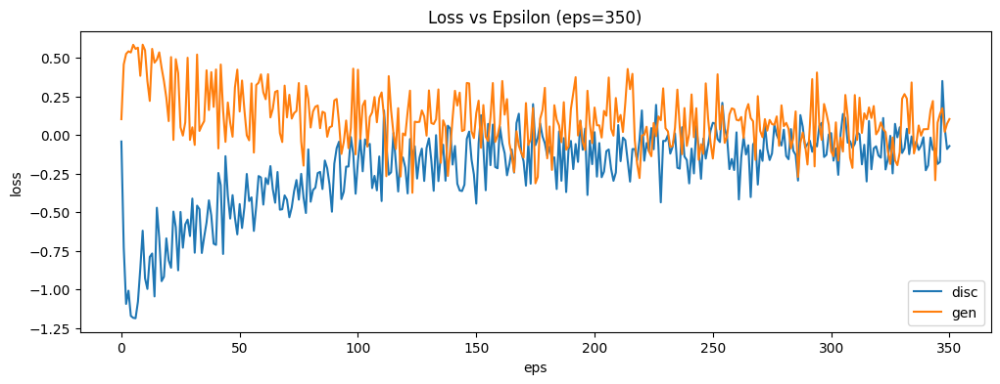

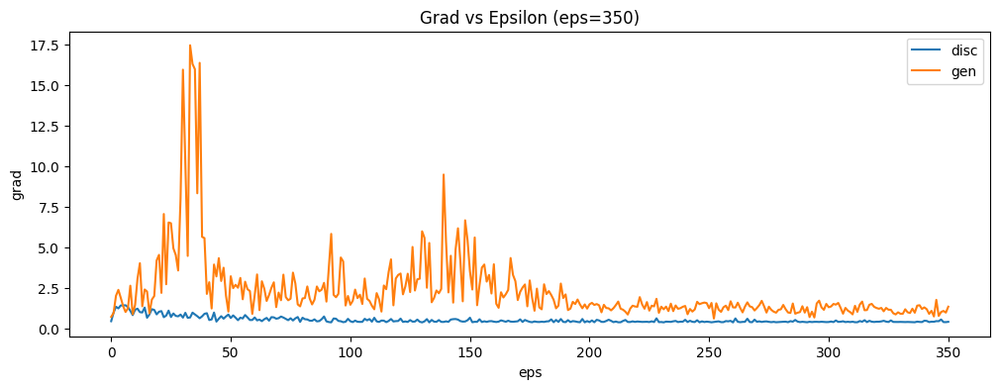

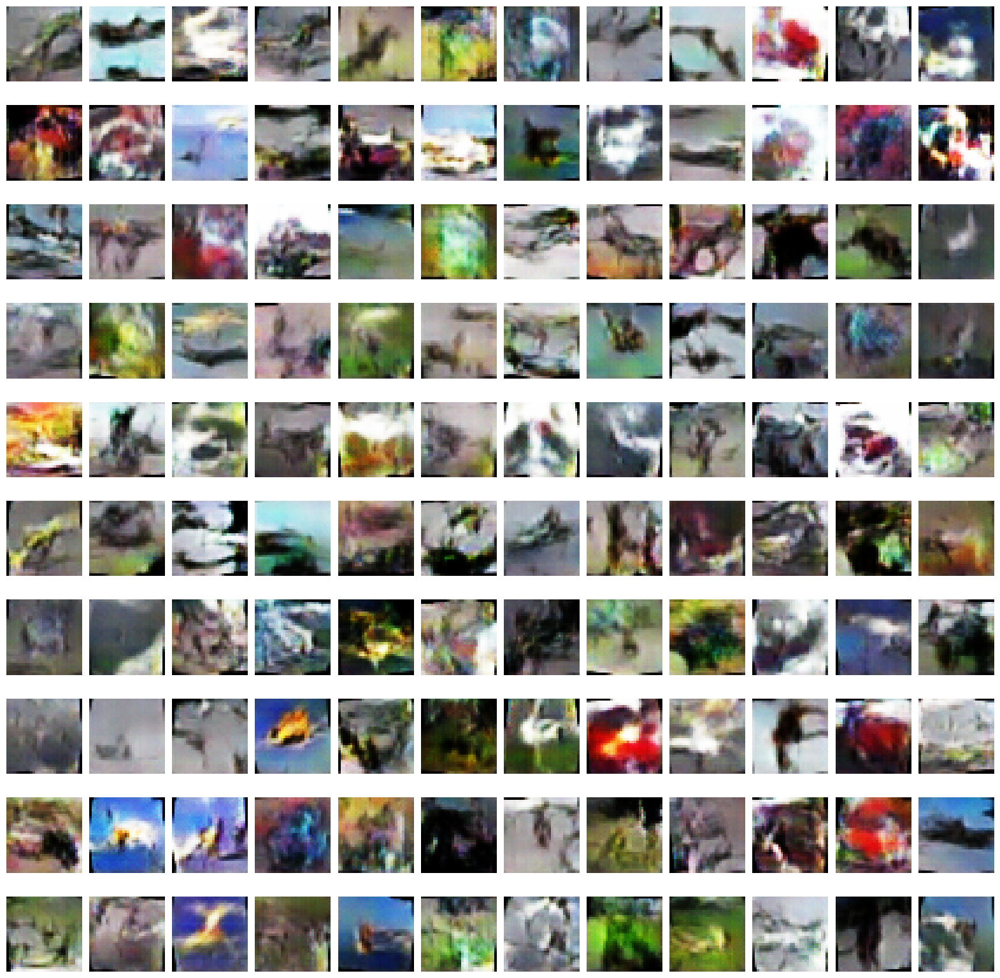

Epoch [351/1001] Loss D: -0.16433, Loss G: -0.04982
Epoch [352/1001] Loss D: 0.03787, Loss G: -0.32411
Epoch [353/1001] Loss D: -0.01926, Loss G: 0.07818
Epoch [354/1001] Loss D: -0.17306, Loss G: -0.14922
Epoch [355/1001] Loss D: -0.02912, Loss G: -0.24272
Epoch [356/1001] Loss D: -0.09623, Loss G: 0.07872
Epoch [357/1001] Loss D: 0.03693, Loss G: 0.09721
Epoch [358/1001] Loss D: -0.02449, Loss G: -0.04447
Epoch [359/1001] Loss D: -0.13324, Loss G: -0.02475
Epoch [360/1001] Loss D: 0.07696, Loss G: 0.32224
Epoch [361/1001] Loss D: -0.06468, Loss G: 0.14014
Epoch [362/1001] Loss D: 0.12905, Loss G: -0.02263
Epoch [363/1001] Loss D: 0.01388, Loss G: -0.07941
Epoch [364/1001] Loss D: -0.15583, Loss G: 0.09337
Epoch [365/1001] Loss D: -0.34213, Loss G: 0.03348
Epoch [366/1001] Loss D: -0.01341, Loss G: 0.11154
Epoch [367/1001] Loss D: -0.31483, Loss G: 0.24126
Epoch [368/1001] Loss D: -0.01819, Loss G: 0.12097
Epoch [369/1001] Loss D: 0.05905, Loss G: -0.04918
Epoch [370/1001] Loss D: 0.0

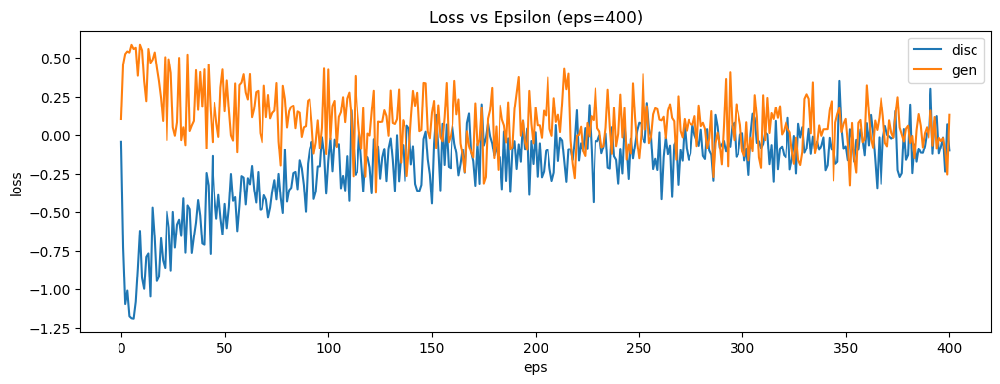

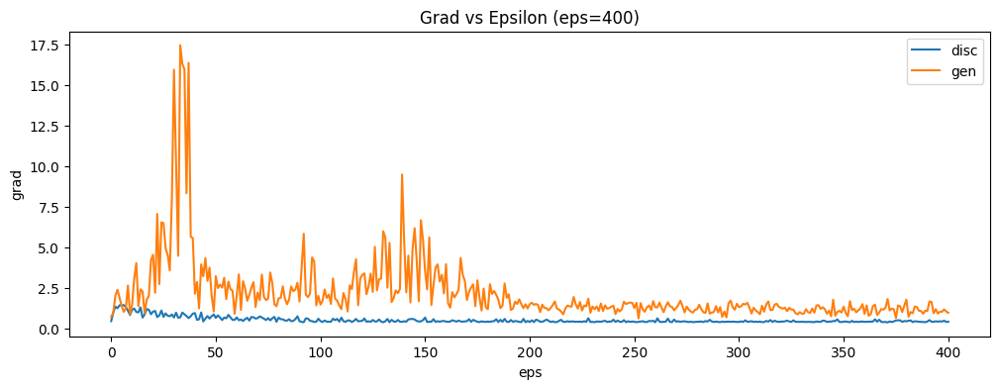

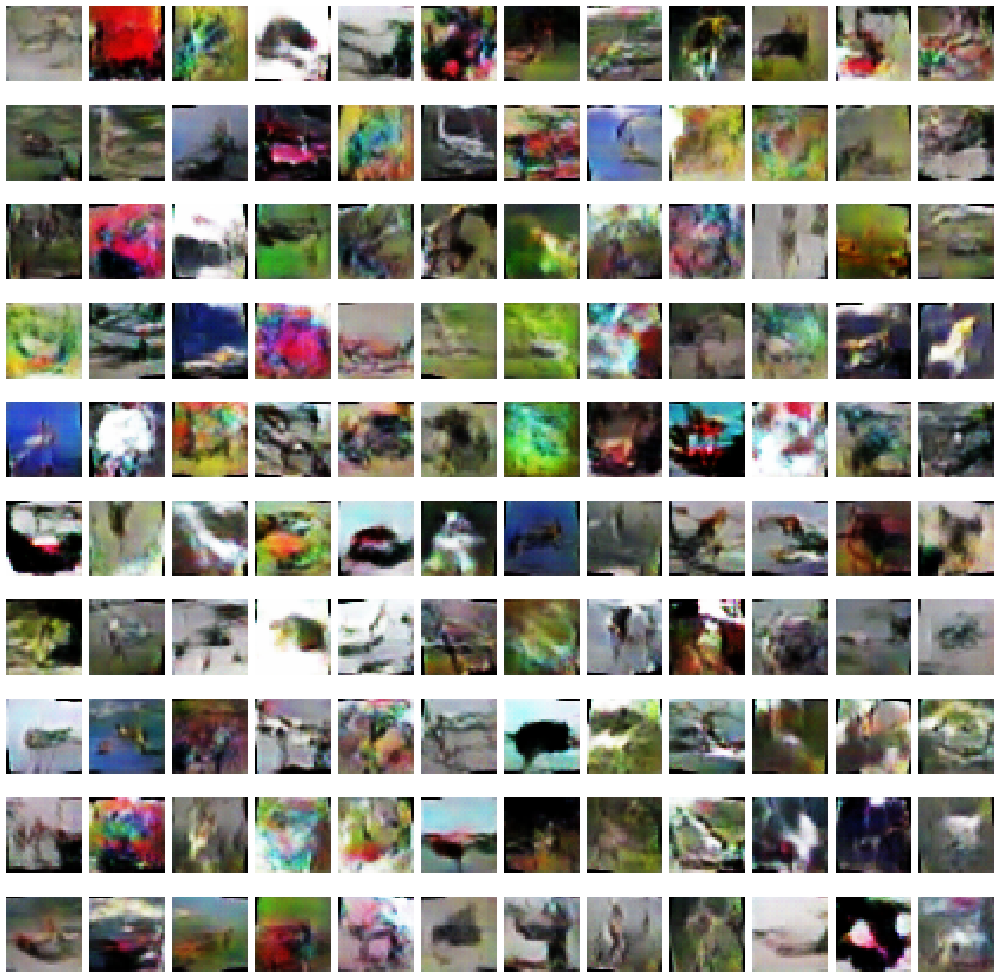

Epoch [401/1001] Loss D: 0.03449, Loss G: -0.10674
Epoch [402/1001] Loss D: -0.00319, Loss G: -0.01218
Epoch [403/1001] Loss D: -0.04784, Loss G: -0.01864
Epoch [404/1001] Loss D: -0.08696, Loss G: -0.22188
Epoch [405/1001] Loss D: -0.20965, Loss G: 0.04921
Epoch [406/1001] Loss D: -0.32357, Loss G: 0.11687
Epoch [407/1001] Loss D: 0.05875, Loss G: 0.16315
Epoch [408/1001] Loss D: -0.02192, Loss G: -0.00835
Epoch [409/1001] Loss D: -0.12200, Loss G: 0.06933
Epoch [410/1001] Loss D: 0.04420, Loss G: 0.16490
Epoch [411/1001] Loss D: -0.24611, Loss G: 0.07111
Epoch [412/1001] Loss D: -0.22123, Loss G: 0.23604
Epoch [413/1001] Loss D: 0.09540, Loss G: 0.09280
Epoch [414/1001] Loss D: -0.02996, Loss G: 0.26911
Epoch [415/1001] Loss D: 0.08153, Loss G: 0.16591
Epoch [416/1001] Loss D: -0.04087, Loss G: -0.54593
Epoch [417/1001] Loss D: -0.02428, Loss G: -0.01429
Epoch [418/1001] Loss D: -0.00393, Loss G: 0.46486
Epoch [419/1001] Loss D: 0.08915, Loss G: 0.45842
Epoch [420/1001] Loss D: 0.024

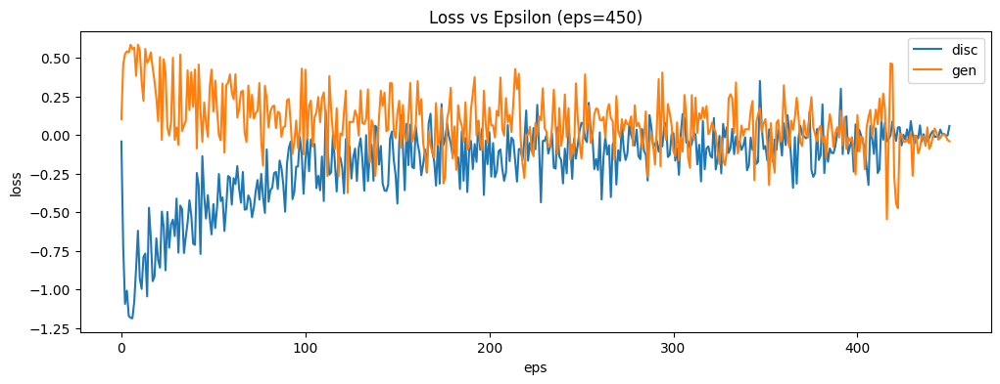

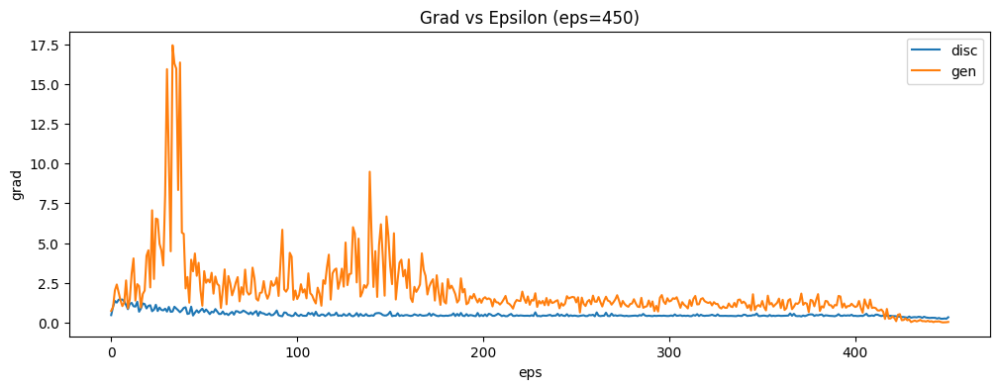

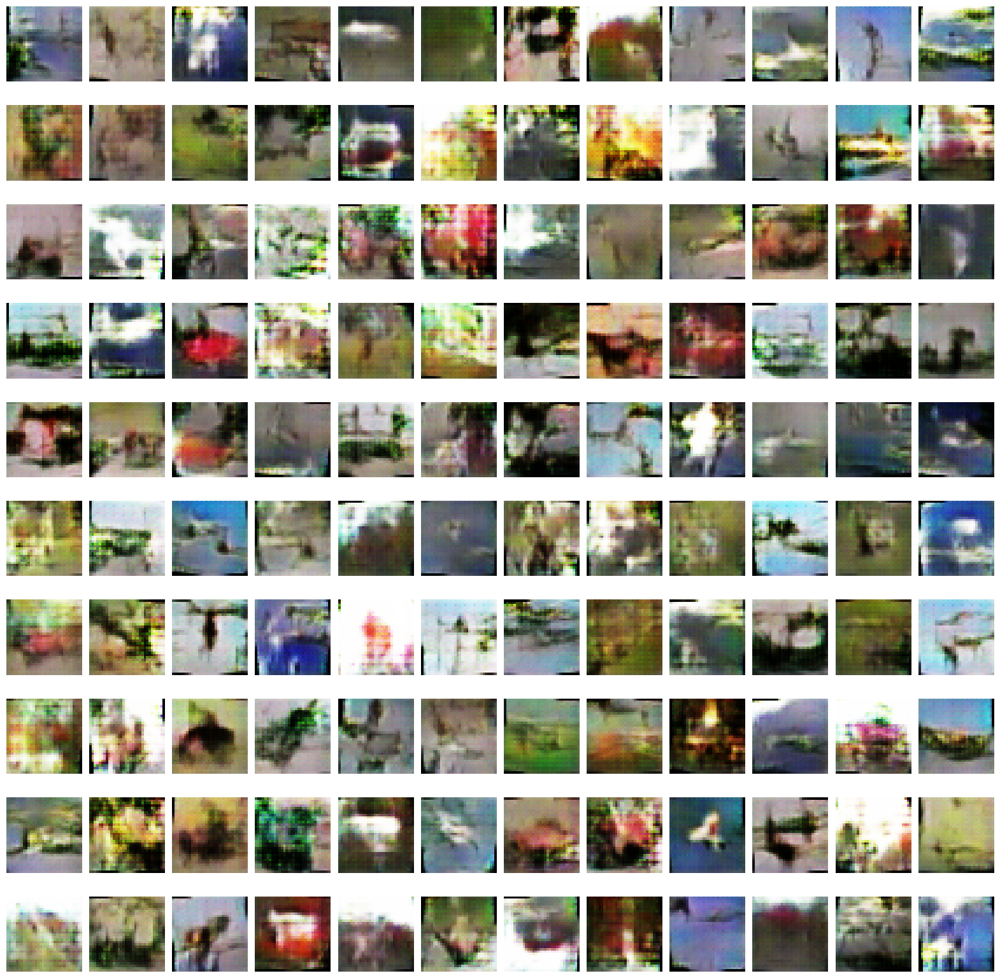

Epoch [451/1001] Loss D: -0.01714, Loss G: 0.00299
Epoch [452/1001] Loss D: -0.00024, Loss G: 0.01108
Epoch [453/1001] Loss D: -0.00298, Loss G: -0.01761
Epoch [454/1001] Loss D: 0.01450, Loss G: -0.01742
Epoch [455/1001] Loss D: 0.00049, Loss G: -0.00160
Epoch [456/1001] Loss D: 0.00562, Loss G: -0.01274
Epoch [457/1001] Loss D: -0.00413, Loss G: 0.00141
Epoch [458/1001] Loss D: -0.00919, Loss G: -0.00122
Epoch [459/1001] Loss D: 0.00390, Loss G: -0.03751
Epoch [460/1001] Loss D: 0.00304, Loss G: -0.03437
Epoch [461/1001] Loss D: -0.02549, Loss G: -0.03551
Epoch [462/1001] Loss D: -0.00698, Loss G: -0.05428
Epoch [463/1001] Loss D: 0.00848, Loss G: -0.04269
Epoch [464/1001] Loss D: 0.00834, Loss G: 0.03273
Epoch [465/1001] Loss D: -0.01562, Loss G: -0.02528
Epoch [466/1001] Loss D: -0.00381, Loss G: -0.01095
Epoch [467/1001] Loss D: -0.01623, Loss G: -0.00940
Epoch [468/1001] Loss D: -0.00023, Loss G: -0.02505
Epoch [469/1001] Loss D: 0.00737, Loss G: -0.01574
Epoch [470/1001] Loss D:

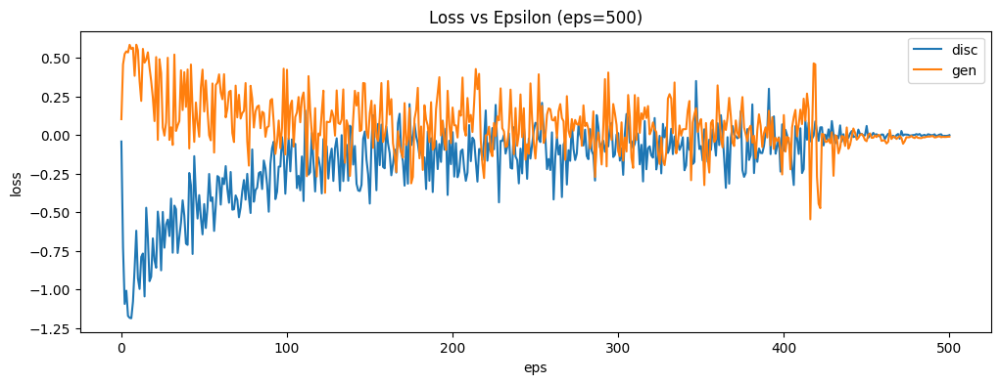

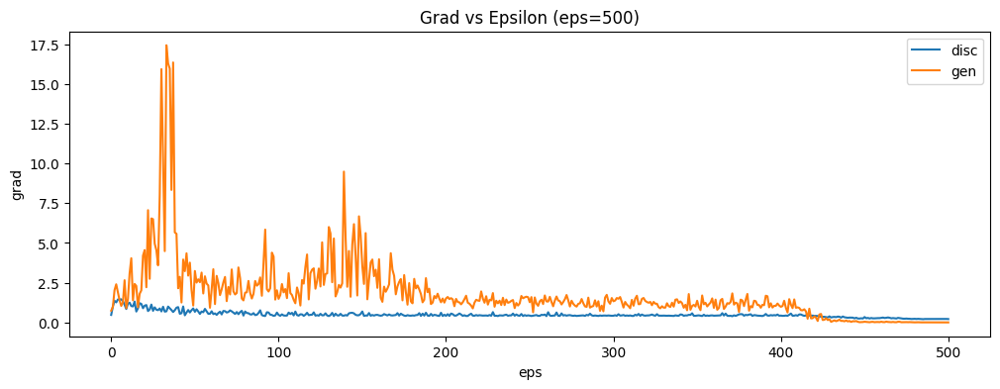

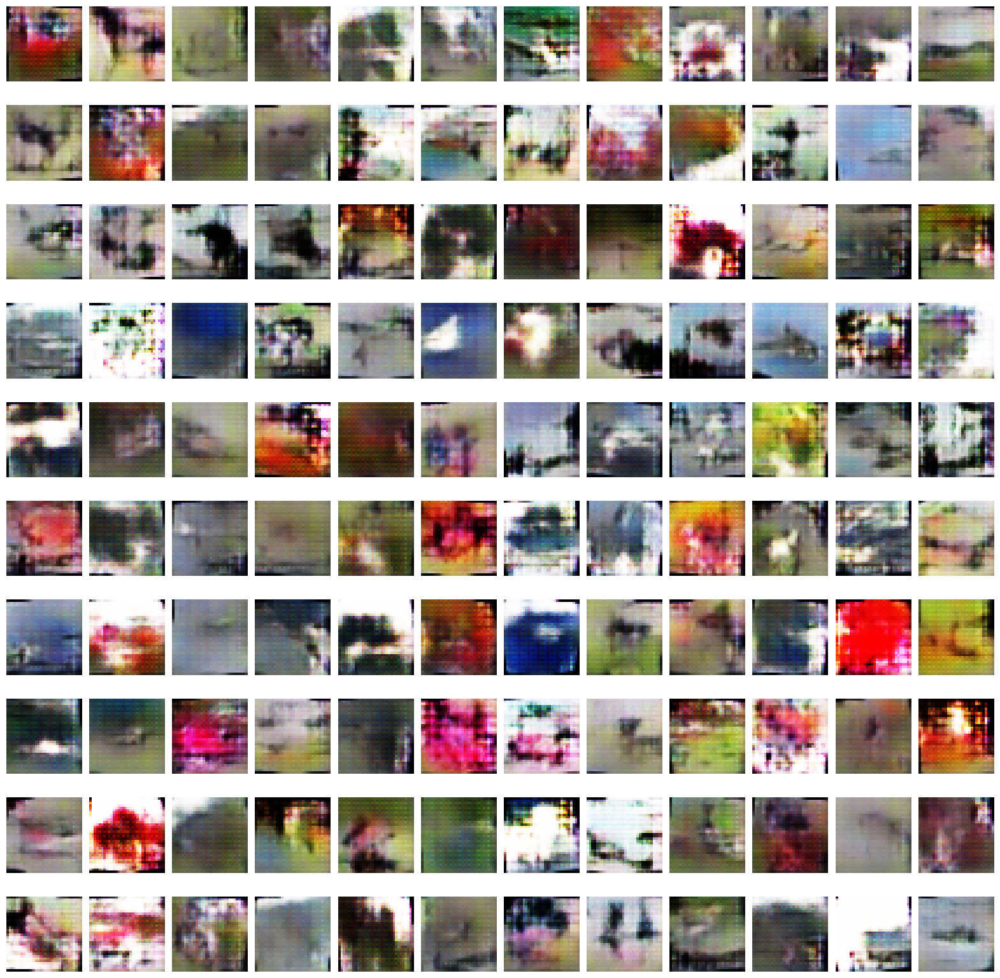

Epoch [501/1001] Loss D: -0.00019, Loss G: -0.00902
Epoch [502/1001] Loss D: -0.00334, Loss G: -0.00890
Epoch [503/1001] Loss D: -0.00073, Loss G: -0.01322
Epoch [504/1001] Loss D: 0.00257, Loss G: -0.01013
Epoch [505/1001] Loss D: 0.00514, Loss G: -0.01133
Epoch [506/1001] Loss D: 0.00581, Loss G: -0.00972
Epoch [507/1001] Loss D: 0.00334, Loss G: -0.00661
Epoch [508/1001] Loss D: -0.00081, Loss G: -0.00356
Epoch [509/1001] Loss D: 0.00081, Loss G: -0.00372
Epoch [510/1001] Loss D: 0.00259, Loss G: -0.00119
Epoch [511/1001] Loss D: -0.00042, Loss G: -0.00062
Epoch [512/1001] Loss D: 0.00224, Loss G: -0.00588
Epoch [513/1001] Loss D: 0.00398, Loss G: -0.00795
Epoch [514/1001] Loss D: 0.00428, Loss G: -0.00795
Epoch [515/1001] Loss D: -0.00091, Loss G: -0.00041
Epoch [516/1001] Loss D: 0.00258, Loss G: 0.00347
Epoch [517/1001] Loss D: 0.00244, Loss G: 0.00198
Epoch [518/1001] Loss D: -0.00189, Loss G: -0.00138
Epoch [519/1001] Loss D: -0.00056, Loss G: 0.00590
Epoch [520/1001] Loss D: 0

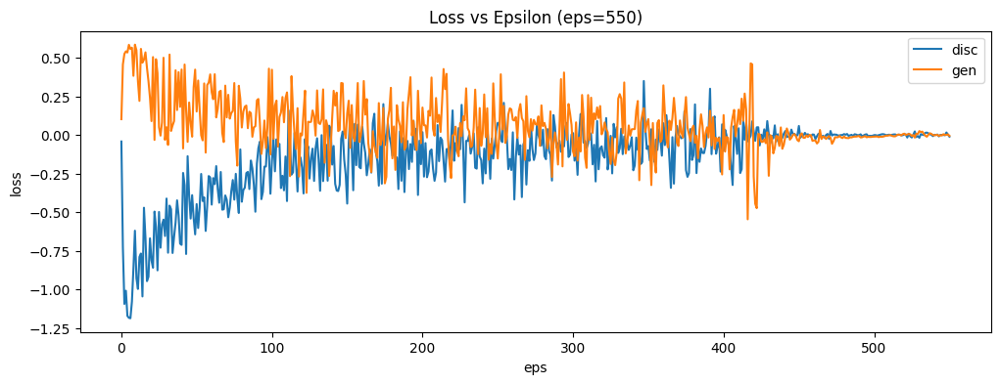

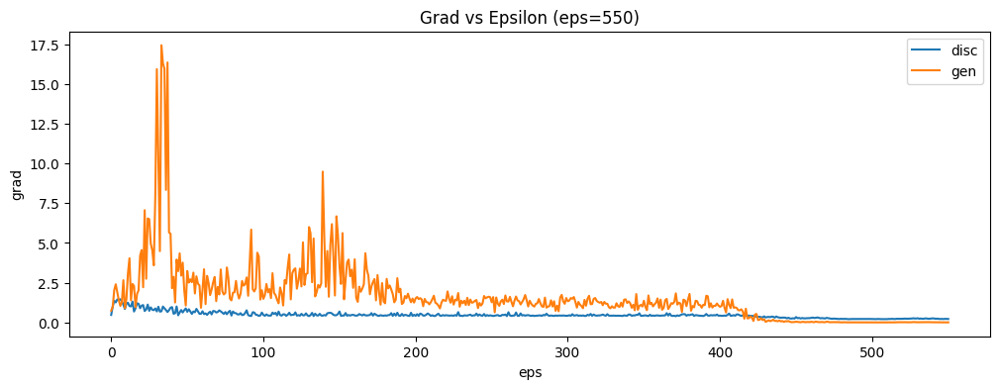

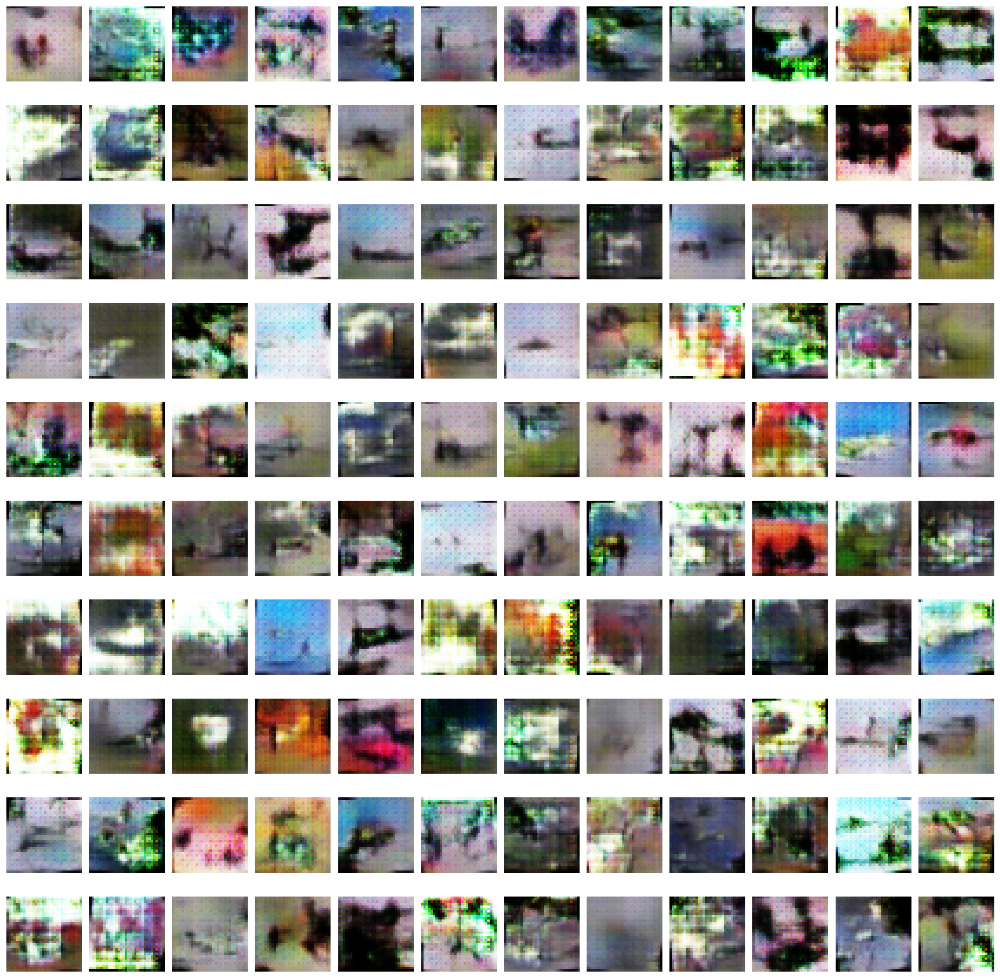

Epoch [551/1001] Loss D: 0.00240, Loss G: 0.00403
Epoch [552/1001] Loss D: 0.00641, Loss G: -0.00135
Epoch [553/1001] Loss D: 0.00647, Loss G: 0.00445
Epoch [554/1001] Loss D: 0.00204, Loss G: 0.00127
Epoch [555/1001] Loss D: 0.00585, Loss G: 0.00047
Epoch [556/1001] Loss D: 0.00273, Loss G: 0.00321
Epoch [557/1001] Loss D: 0.00363, Loss G: 0.00996
Epoch [558/1001] Loss D: -0.00022, Loss G: -0.00261
Epoch [559/1001] Loss D: -0.00421, Loss G: 0.00518
Epoch [560/1001] Loss D: 0.00123, Loss G: 0.00230
Epoch [561/1001] Loss D: -0.00037, Loss G: 0.00184
Epoch [562/1001] Loss D: -0.00327, Loss G: -0.00112
Epoch [563/1001] Loss D: 0.00201, Loss G: 0.00045
Epoch [564/1001] Loss D: 0.00058, Loss G: -0.00230
Epoch [565/1001] Loss D: 0.00161, Loss G: 0.00282
Epoch [566/1001] Loss D: -0.00404, Loss G: 0.00018
Epoch [567/1001] Loss D: -0.00105, Loss G: 0.00215
Epoch [568/1001] Loss D: 0.00589, Loss G: 0.00036
Epoch [569/1001] Loss D: 0.00290, Loss G: -0.00176
Epoch [570/1001] Loss D: 0.00389, Loss 

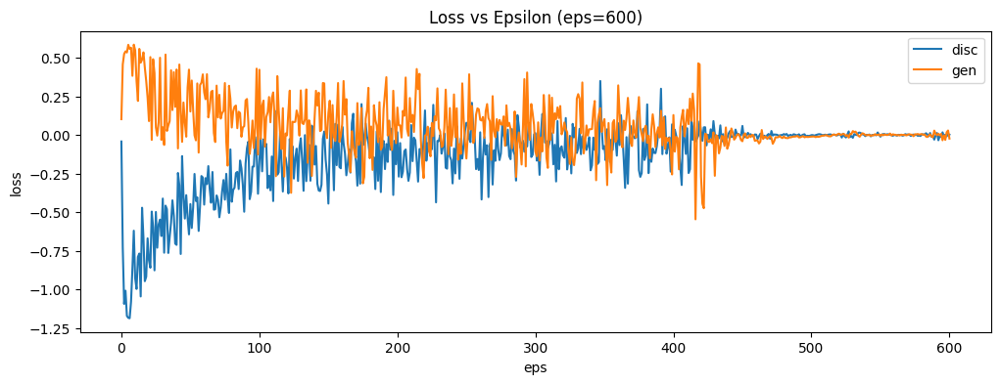

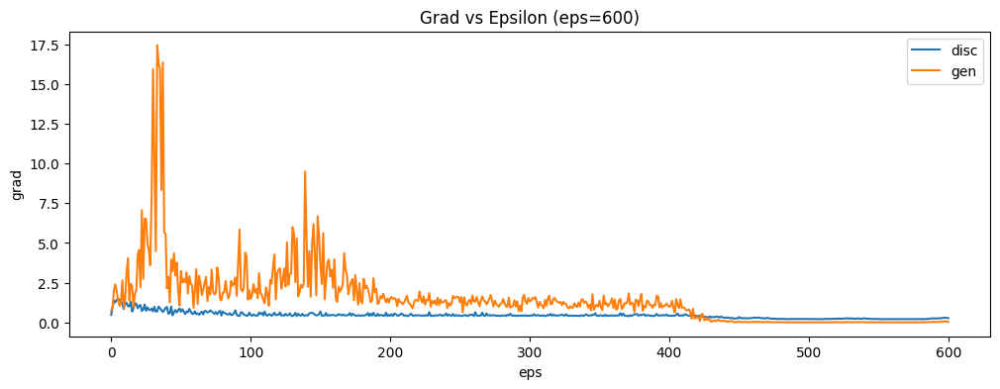

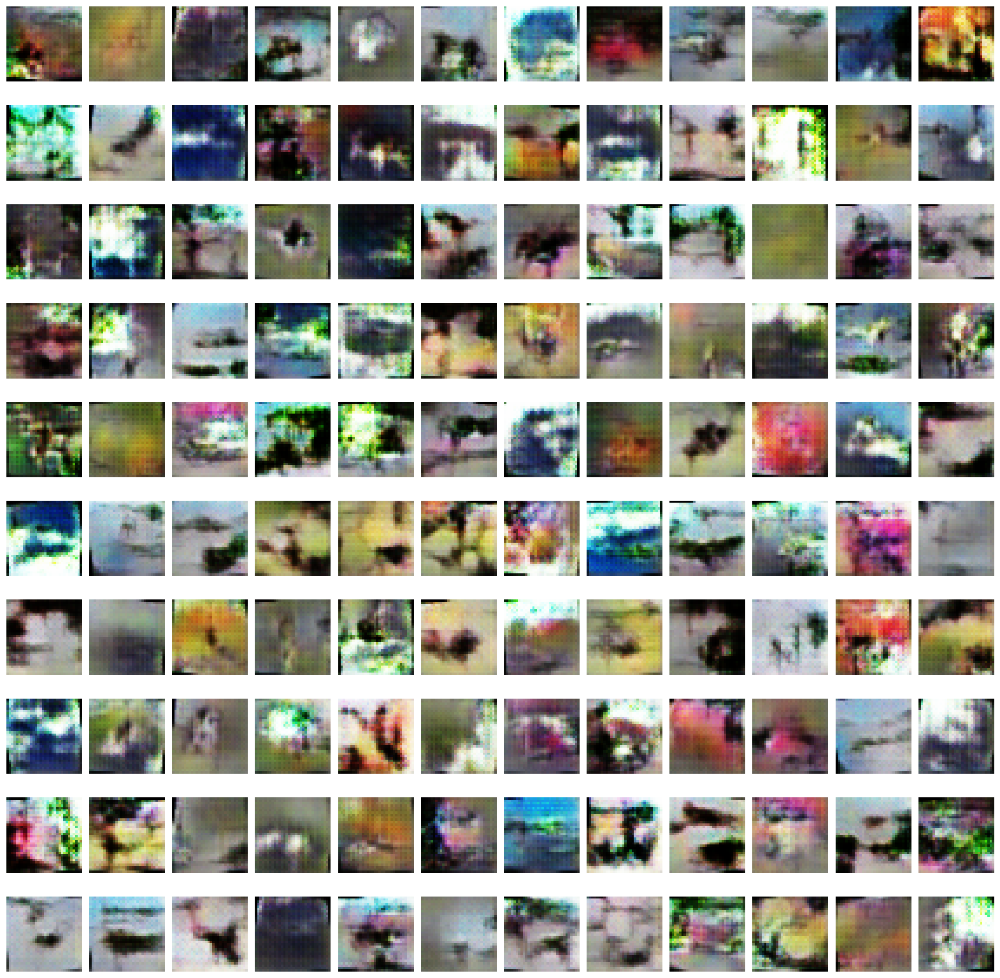

Epoch [601/1001] Loss D: 0.00409, Loss G: -0.01128
Epoch [602/1001] Loss D: -0.00901, Loss G: -0.01207
Epoch [603/1001] Loss D: 0.00995, Loss G: -0.01733
Epoch [604/1001] Loss D: -0.02737, Loss G: -0.01492
Epoch [605/1001] Loss D: 0.00658, Loss G: -0.00458
Epoch [606/1001] Loss D: -0.01898, Loss G: -0.01557
Epoch [607/1001] Loss D: -0.00262, Loss G: 0.01166
Epoch [608/1001] Loss D: 0.00225, Loss G: -0.02961
Epoch [609/1001] Loss D: 0.00900, Loss G: -0.01962
Epoch [610/1001] Loss D: -0.01541, Loss G: -0.00728
Epoch [611/1001] Loss D: 0.01083, Loss G: 0.01853
Epoch [612/1001] Loss D: 0.02146, Loss G: 0.00174
Epoch [613/1001] Loss D: 0.01237, Loss G: 0.04307
Epoch [614/1001] Loss D: -0.00470, Loss G: 0.04476
Epoch [615/1001] Loss D: -0.00081, Loss G: 0.04372
Epoch [616/1001] Loss D: 0.01387, Loss G: 0.04651
Epoch [617/1001] Loss D: -0.04537, Loss G: 0.07888
Epoch [618/1001] Loss D: 0.18123, Loss G: 0.02755
Epoch [619/1001] Loss D: -0.07320, Loss G: -0.00715
Epoch [620/1001] Loss D: -0.199

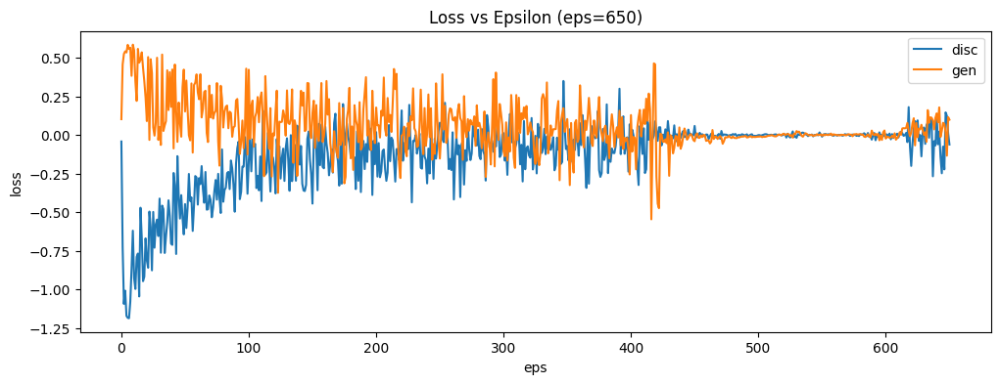

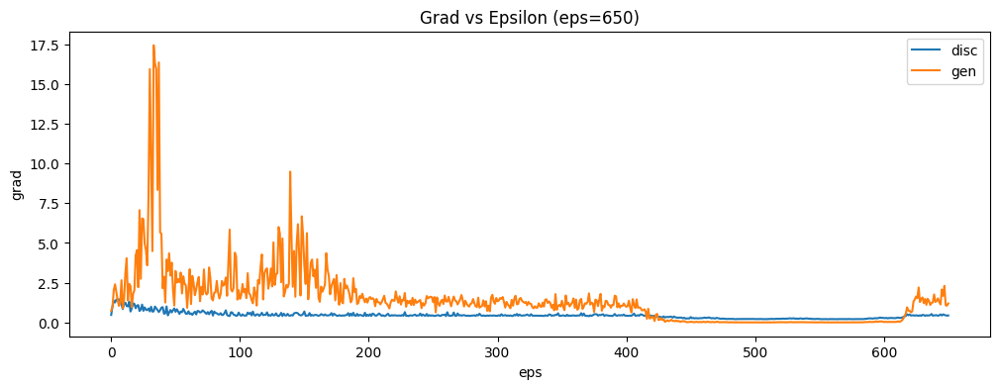

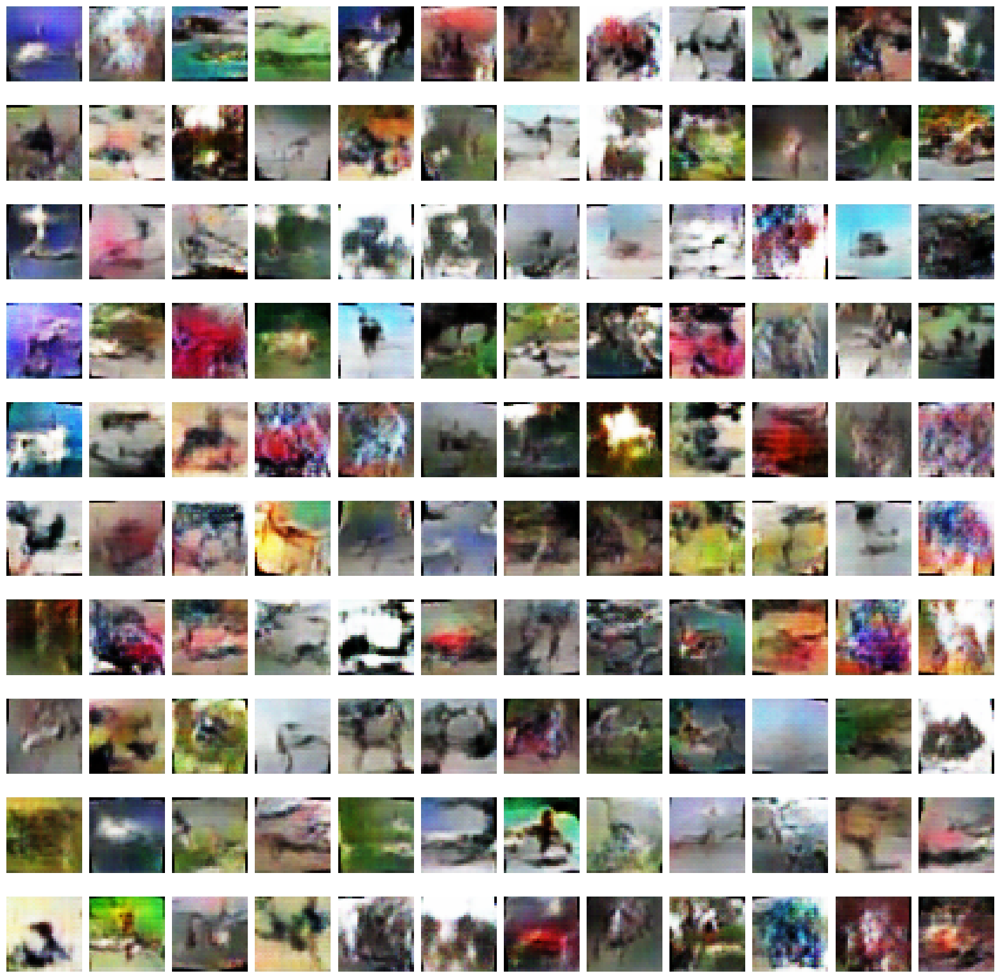

Epoch [651/1001] Loss D: -0.05530, Loss G: 0.07707
Epoch [652/1001] Loss D: -0.14566, Loss G: 0.04527
Epoch [653/1001] Loss D: -0.23549, Loss G: 0.04785
Epoch [654/1001] Loss D: 0.02539, Loss G: 0.06330
Epoch [655/1001] Loss D: -0.02220, Loss G: 0.11135
Epoch [656/1001] Loss D: -0.18364, Loss G: 0.08243
Epoch [657/1001] Loss D: 0.00796, Loss G: 0.08488
Epoch [658/1001] Loss D: -0.11655, Loss G: 0.02380
Epoch [659/1001] Loss D: -0.24632, Loss G: 0.07529
Epoch [660/1001] Loss D: 0.01713, Loss G: -0.14645
Epoch [661/1001] Loss D: 0.04039, Loss G: 0.00344
Epoch [662/1001] Loss D: -0.29608, Loss G: 0.09243
Epoch [663/1001] Loss D: -0.00135, Loss G: 0.06799
Epoch [664/1001] Loss D: -0.03052, Loss G: -0.00248
Epoch [665/1001] Loss D: 0.03835, Loss G: -0.03595
Epoch [666/1001] Loss D: 0.15533, Loss G: -0.15837
Epoch [667/1001] Loss D: -0.37407, Loss G: 0.08646
Epoch [668/1001] Loss D: -0.10571, Loss G: -0.28092
Epoch [669/1001] Loss D: -0.06891, Loss G: 0.01036
Epoch [670/1001] Loss D: -0.1548

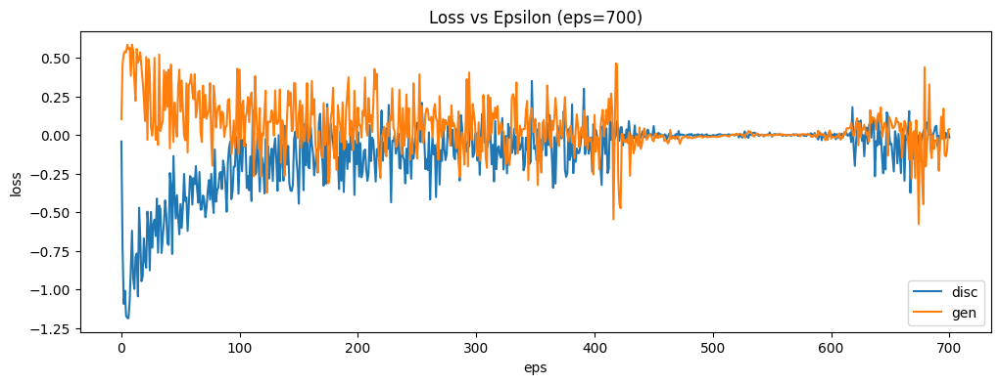

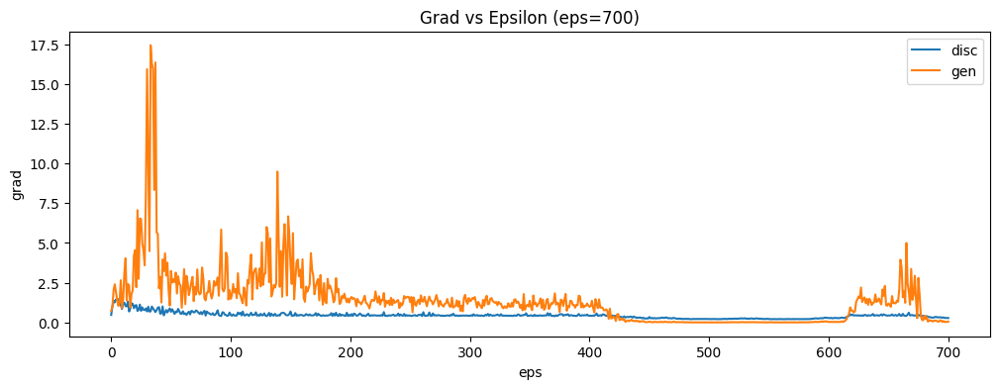

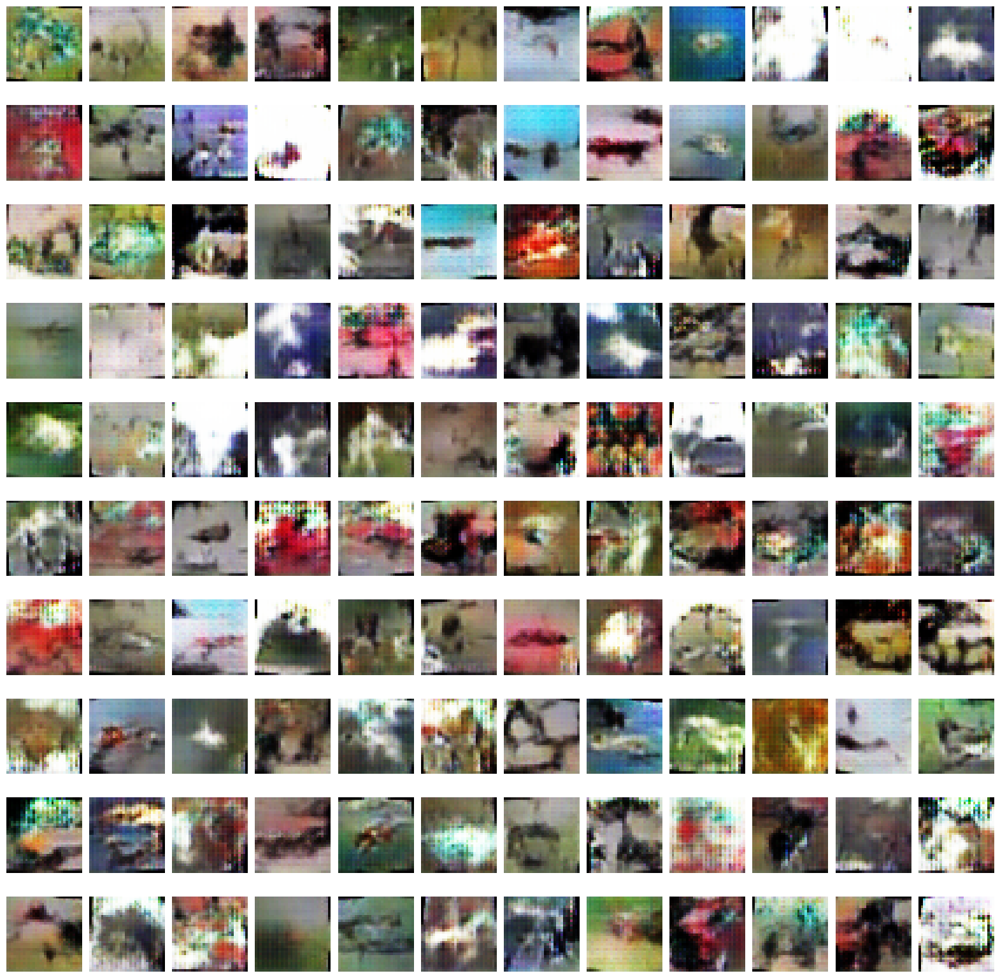

Epoch [701/1001] Loss D: 0.00703, Loss G: -0.06781
Epoch [702/1001] Loss D: 0.00941, Loss G: -0.04883
Epoch [703/1001] Loss D: 0.02586, Loss G: 0.02580
Epoch [704/1001] Loss D: 0.03141, Loss G: -0.04361
Epoch [705/1001] Loss D: -0.01886, Loss G: 0.02033
Epoch [706/1001] Loss D: 0.00890, Loss G: -0.06988
Epoch [707/1001] Loss D: 0.02681, Loss G: -0.08967
Epoch [708/1001] Loss D: -0.00341, Loss G: -0.10495
Epoch [709/1001] Loss D: 0.00460, Loss G: -0.04310
Epoch [710/1001] Loss D: -0.00528, Loss G: -0.00887
Epoch [711/1001] Loss D: -0.00132, Loss G: -0.05211
Epoch [712/1001] Loss D: -0.00607, Loss G: -0.04331
Epoch [713/1001] Loss D: -0.00057, Loss G: -0.06832
Epoch [714/1001] Loss D: 0.02154, Loss G: -0.05196
Epoch [715/1001] Loss D: 0.01039, Loss G: -0.04690
Epoch [716/1001] Loss D: 0.00122, Loss G: -0.03726
Epoch [717/1001] Loss D: 0.00068, Loss G: -0.04560
Epoch [718/1001] Loss D: -0.01419, Loss G: -0.01730
Epoch [719/1001] Loss D: 0.00339, Loss G: -0.01771
Epoch [720/1001] Loss D: -

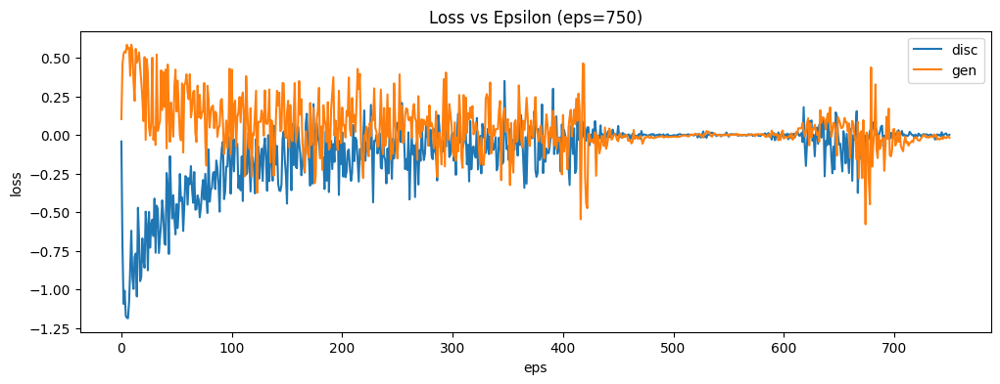

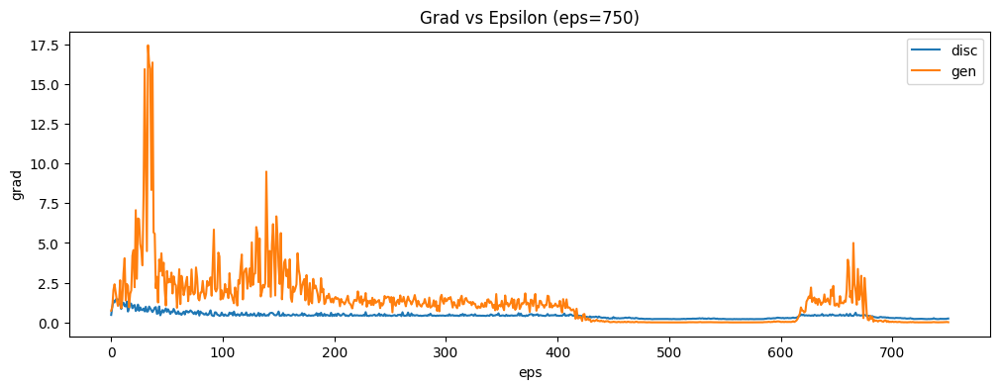

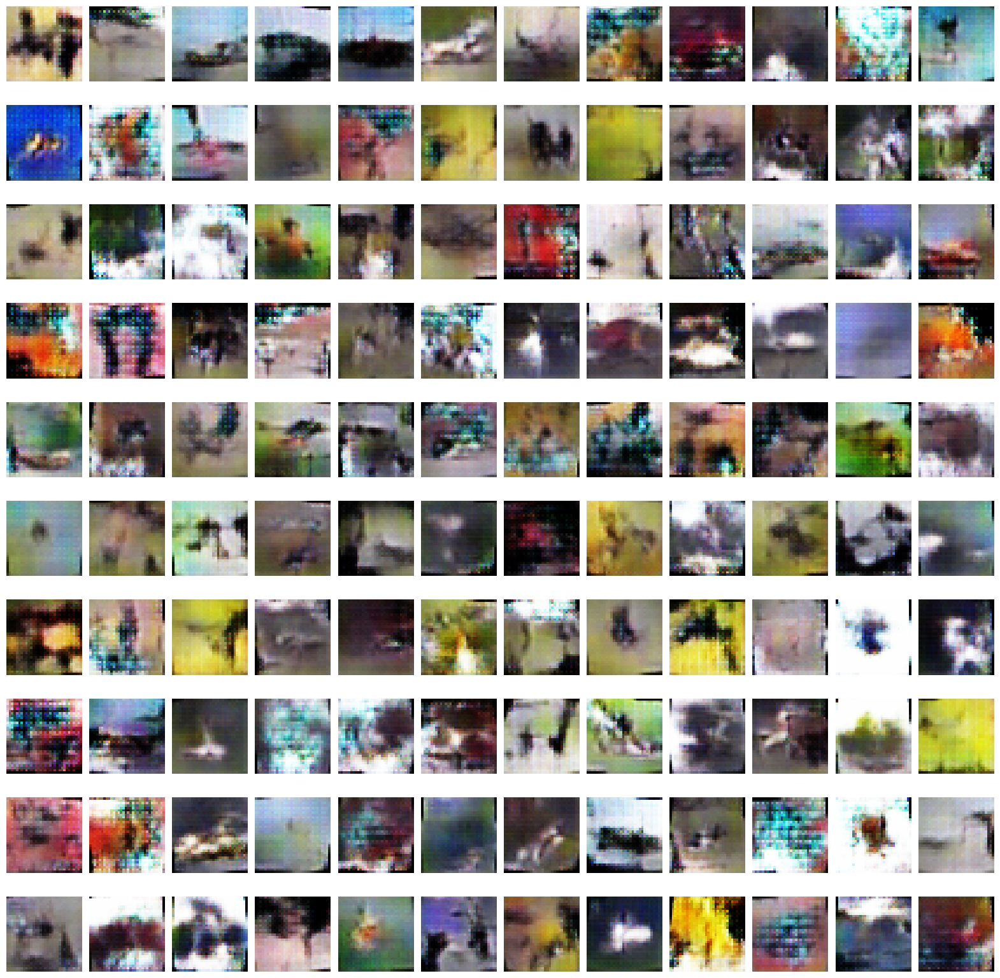

Epoch [751/1001] Loss D: 0.00189, Loss G: -0.00438
Epoch [752/1001] Loss D: -0.00608, Loss G: -0.01844
Epoch [753/1001] Loss D: -0.00903, Loss G: -0.00196
Epoch [754/1001] Loss D: 0.00810, Loss G: 0.00661
Epoch [755/1001] Loss D: -0.01151, Loss G: 0.00764
Epoch [756/1001] Loss D: -0.01152, Loss G: 0.01044
Epoch [757/1001] Loss D: -0.00241, Loss G: -0.00097
Epoch [758/1001] Loss D: -0.00941, Loss G: -0.00748
Epoch [759/1001] Loss D: 0.01257, Loss G: 0.01256
Epoch [760/1001] Loss D: -0.03662, Loss G: -0.02087
Epoch [761/1001] Loss D: 0.00691, Loss G: 0.02764
Epoch [762/1001] Loss D: -0.00307, Loss G: -0.00376
Epoch [763/1001] Loss D: -0.01370, Loss G: 0.01813
Epoch [764/1001] Loss D: -0.00791, Loss G: -0.02671
Epoch [765/1001] Loss D: -0.00890, Loss G: -0.04693
Epoch [766/1001] Loss D: -0.00992, Loss G: -0.01677
Epoch [767/1001] Loss D: -0.00427, Loss G: -0.01841
Epoch [768/1001] Loss D: 0.00547, Loss G: -0.03977
Epoch [769/1001] Loss D: -0.01208, Loss G: -0.01666
Epoch [770/1001] Loss D

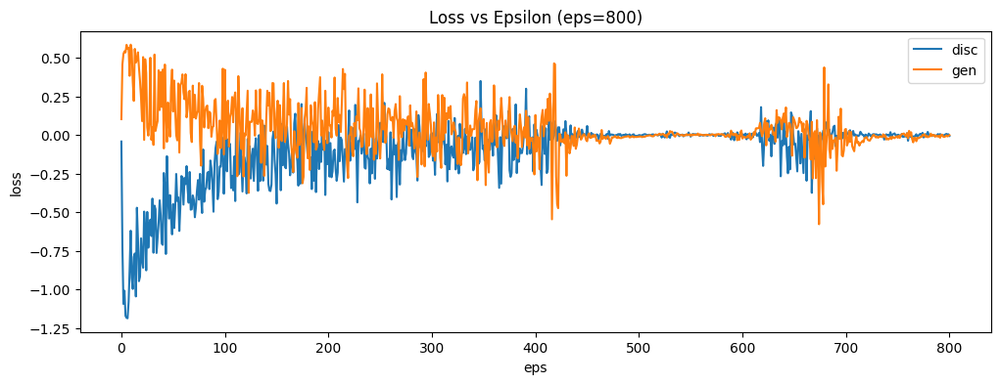

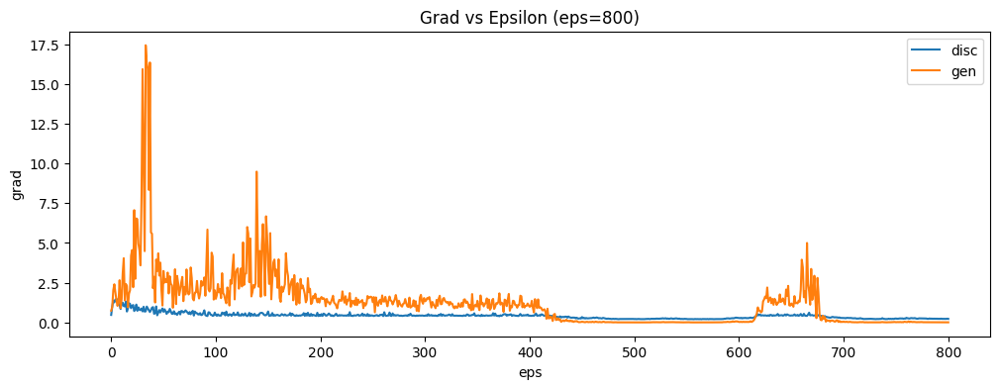

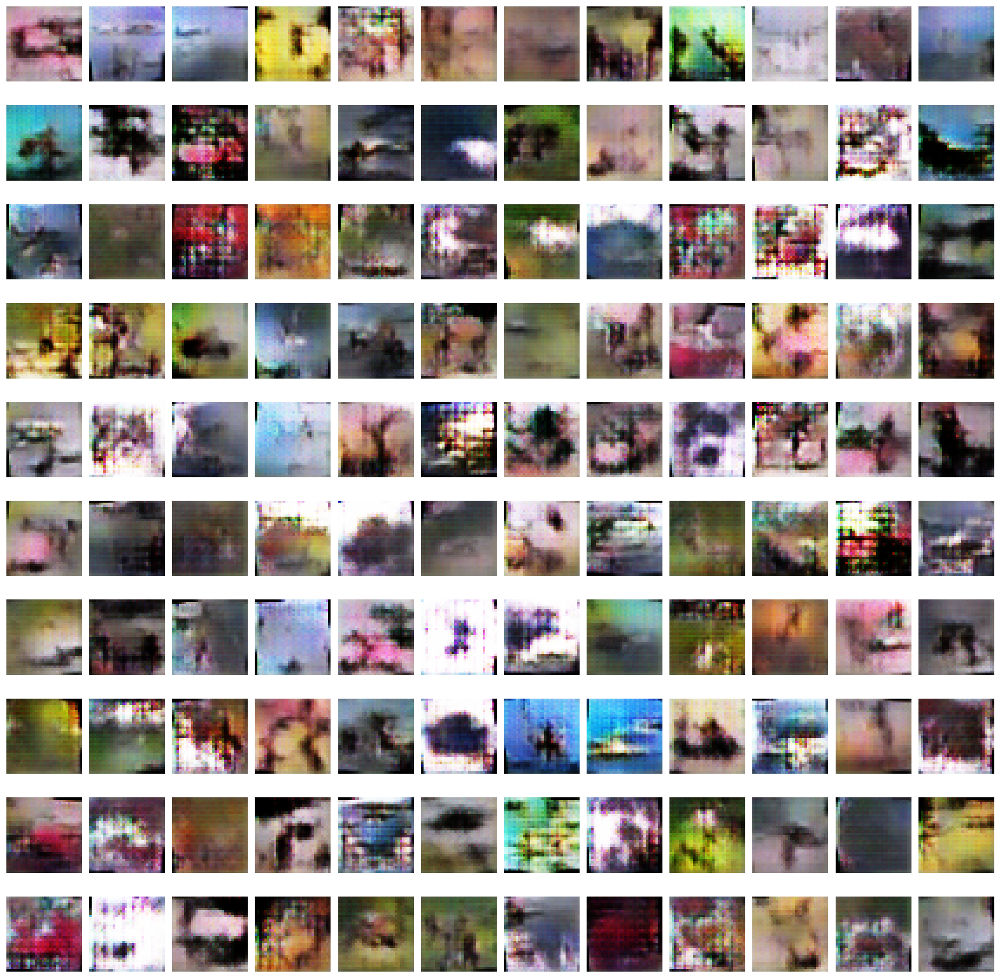

Epoch [801/1001] Loss D: -0.00669, Loss G: -0.00985
Epoch [802/1001] Loss D: -0.00152, Loss G: -0.00034
Epoch [803/1001] Loss D: 0.00788, Loss G: -0.00595
Epoch [804/1001] Loss D: -0.00668, Loss G: -0.00392
Epoch [805/1001] Loss D: 0.01641, Loss G: -0.00999
Epoch [806/1001] Loss D: -0.00362, Loss G: -0.00385
Epoch [807/1001] Loss D: -0.00626, Loss G: -0.01041
Epoch [808/1001] Loss D: 0.00535, Loss G: -0.01046
Epoch [809/1001] Loss D: -0.00272, Loss G: -0.00286
Epoch [810/1001] Loss D: 0.00274, Loss G: -0.00355
Epoch [811/1001] Loss D: 0.00041, Loss G: 0.00045
Epoch [812/1001] Loss D: -0.00398, Loss G: 0.00123
Epoch [813/1001] Loss D: 0.00302, Loss G: -0.00226
Epoch [814/1001] Loss D: 0.01100, Loss G: -0.00091
Epoch [815/1001] Loss D: 0.00634, Loss G: 0.00297
Epoch [816/1001] Loss D: 0.00268, Loss G: 0.00416
Epoch [817/1001] Loss D: -0.00531, Loss G: 0.00908
Epoch [818/1001] Loss D: 0.00653, Loss G: -0.00498
Epoch [819/1001] Loss D: 0.00551, Loss G: 0.00274
Epoch [820/1001] Loss D: 0.00

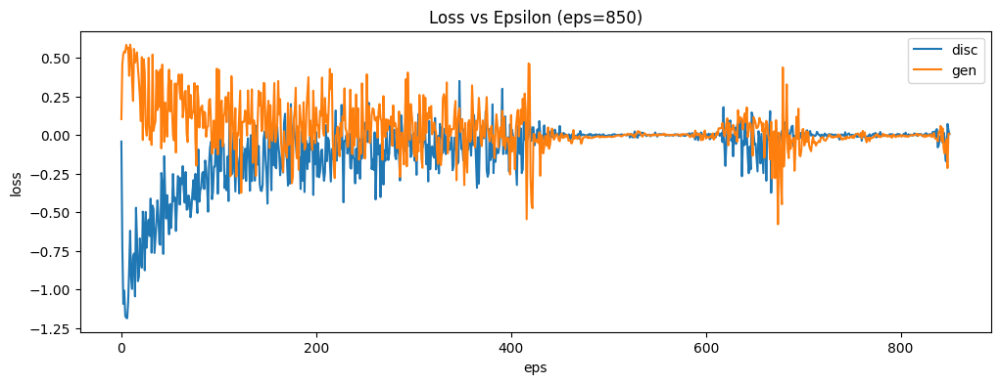

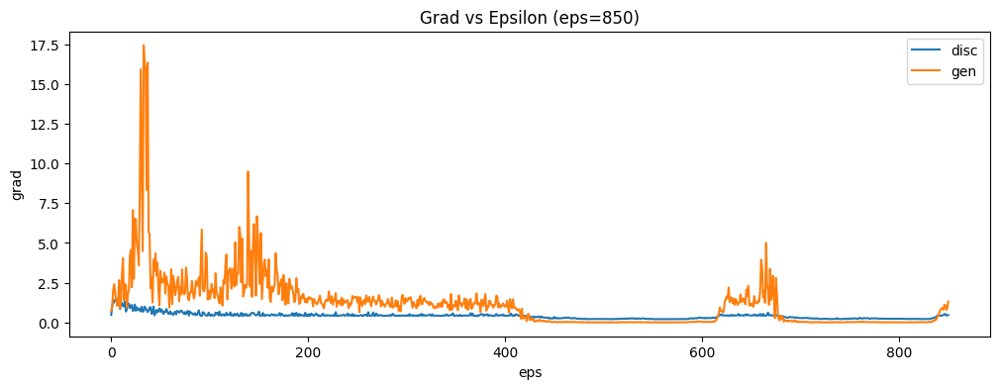

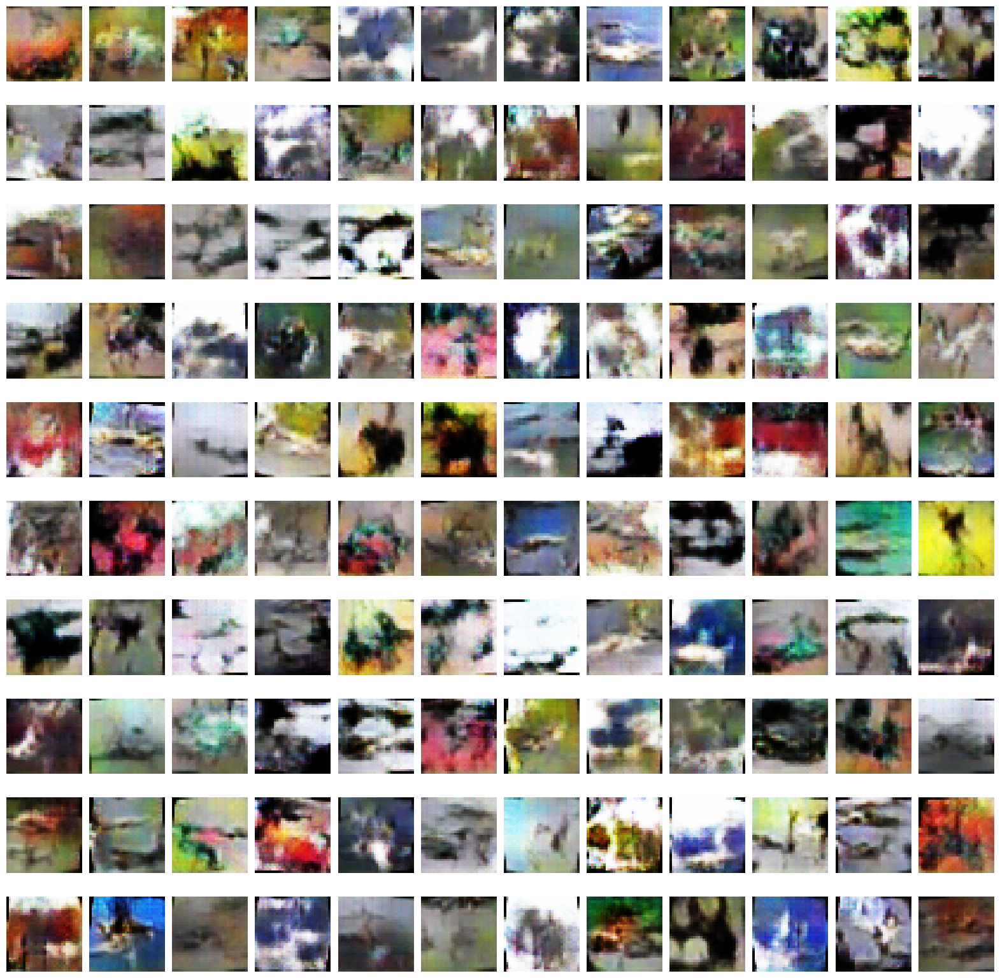

Epoch [851/1001] Loss D: -0.12763, Loss G: -0.01150
Epoch [852/1001] Loss D: -0.11296, Loss G: 0.04071
Epoch [853/1001] Loss D: -0.25233, Loss G: -0.03539
Epoch [854/1001] Loss D: -0.08474, Loss G: 0.18473
Epoch [855/1001] Loss D: 0.22101, Loss G: 0.06697
Epoch [856/1001] Loss D: -0.10687, Loss G: 0.27939
Epoch [857/1001] Loss D: -0.00019, Loss G: -0.00755
Epoch [858/1001] Loss D: -0.11121, Loss G: -0.04291
Epoch [859/1001] Loss D: -0.01973, Loss G: 0.11645
Epoch [860/1001] Loss D: -0.20291, Loss G: -0.04121
Epoch [861/1001] Loss D: -0.11899, Loss G: -0.04475
Epoch [862/1001] Loss D: 0.16517, Loss G: 0.04722
Epoch [863/1001] Loss D: -0.06651, Loss G: 0.00338
Epoch [864/1001] Loss D: 0.00785, Loss G: -0.04516
Epoch [865/1001] Loss D: -0.15692, Loss G: 0.08923
Epoch [866/1001] Loss D: -0.06891, Loss G: -0.07491
Epoch [867/1001] Loss D: 0.03908, Loss G: 0.24080
Epoch [868/1001] Loss D: 0.00521, Loss G: 0.10377
Epoch [869/1001] Loss D: 0.00329, Loss G: 0.03110
Epoch [870/1001] Loss D: -0.2

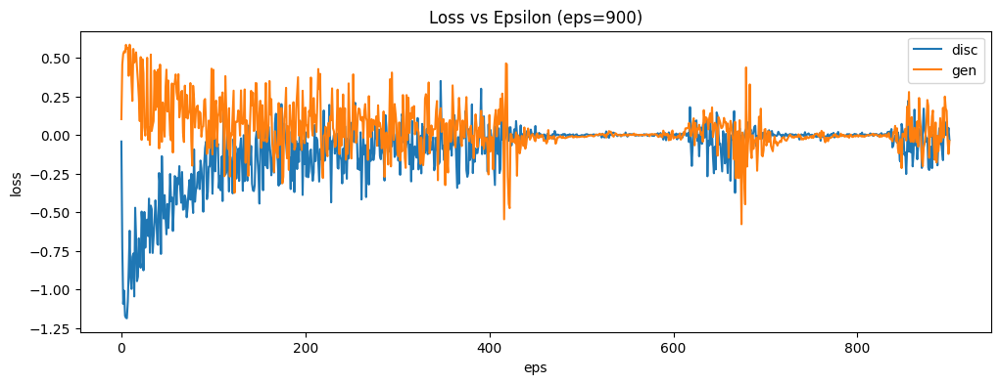

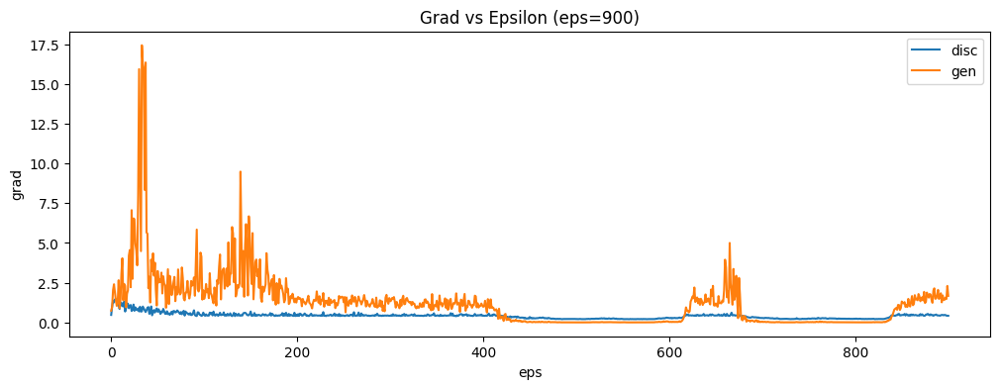

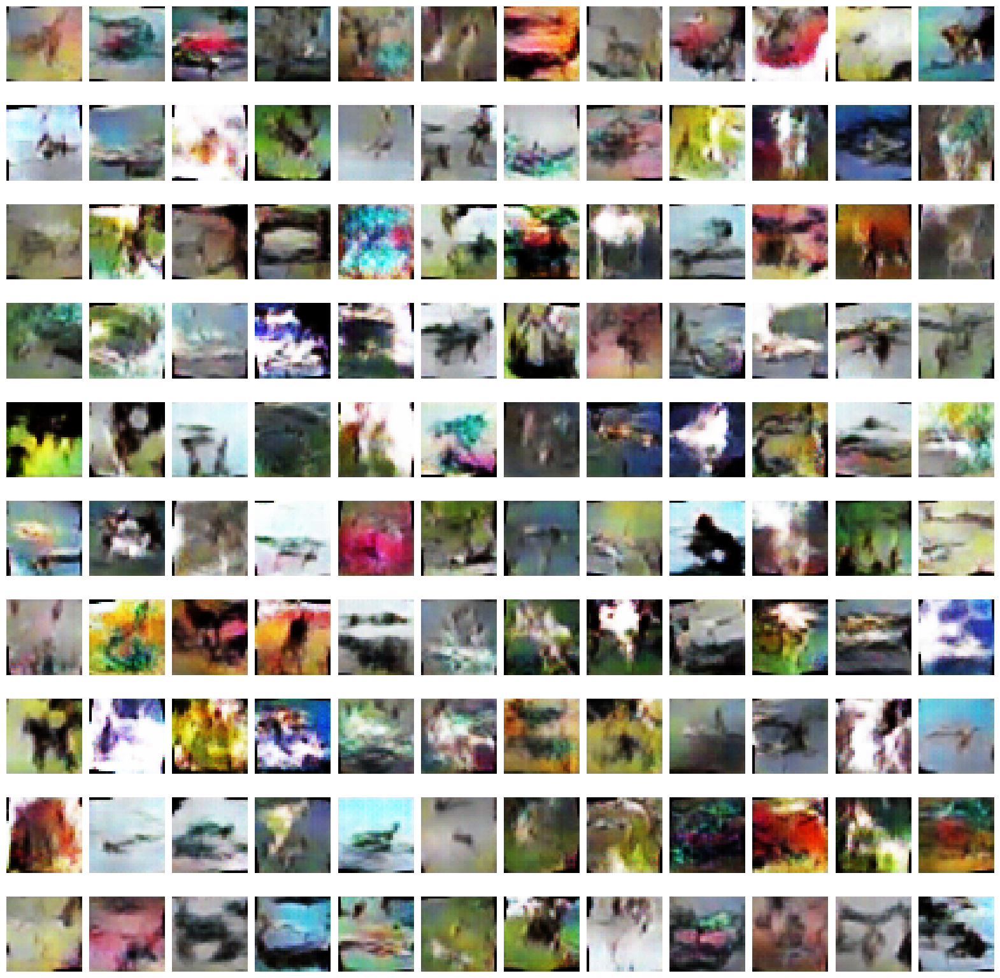

Epoch [901/1001] Loss D: 0.04345, Loss G: -0.22443
Epoch [902/1001] Loss D: -0.19976, Loss G: 0.15046
Epoch [903/1001] Loss D: -0.22078, Loss G: 0.01906
Epoch [904/1001] Loss D: 0.10868, Loss G: -0.02398
Epoch [905/1001] Loss D: 0.09578, Loss G: 0.10324
Epoch [906/1001] Loss D: -0.04057, Loss G: -0.05342
Epoch [907/1001] Loss D: -0.11779, Loss G: -0.05180
Epoch [908/1001] Loss D: -0.13132, Loss G: -0.14128
Epoch [909/1001] Loss D: -0.07172, Loss G: 0.15411
Epoch [910/1001] Loss D: -0.06871, Loss G: -0.00483
Epoch [911/1001] Loss D: -0.03451, Loss G: -0.06496
Epoch [912/1001] Loss D: -0.23589, Loss G: 0.04498
Epoch [913/1001] Loss D: -0.02812, Loss G: 0.19793
Epoch [914/1001] Loss D: -0.12038, Loss G: -0.09661
Epoch [915/1001] Loss D: -0.18543, Loss G: -0.00050
Epoch [916/1001] Loss D: -0.26529, Loss G: -0.00259
Epoch [917/1001] Loss D: -0.15473, Loss G: 0.16803
Epoch [918/1001] Loss D: 0.27451, Loss G: -0.08293
Epoch [919/1001] Loss D: 0.03572, Loss G: 0.10481
Epoch [920/1001] Loss D: 

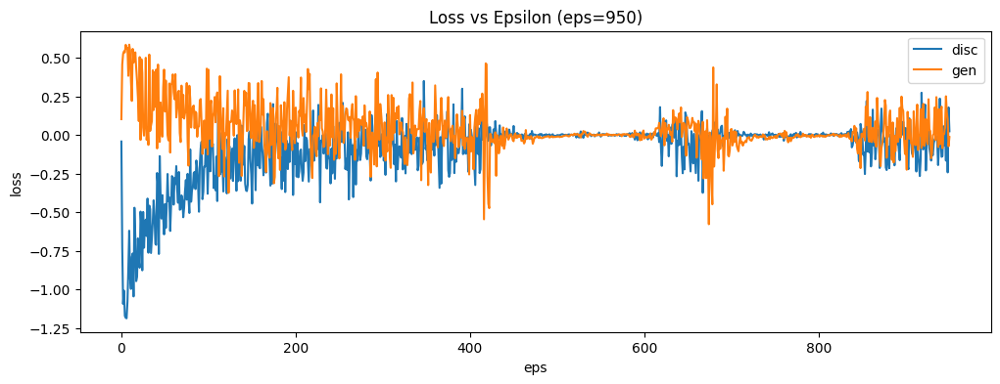

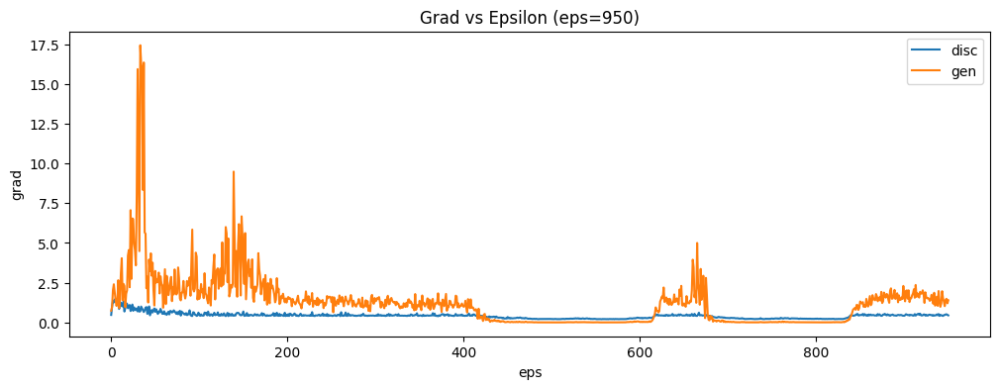

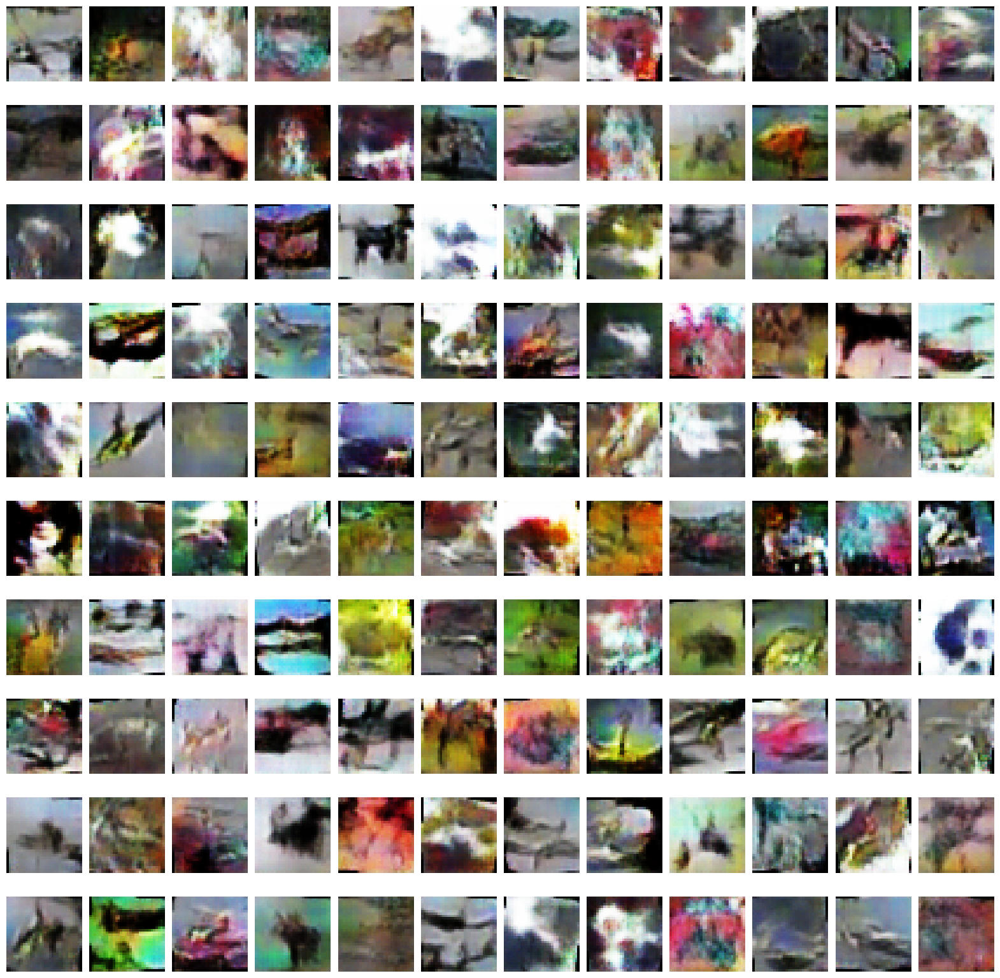

Epoch [951/1001] Loss D: 0.00934, Loss G: -0.06956
Epoch [952/1001] Loss D: -0.18729, Loss G: -0.03780
Epoch [953/1001] Loss D: -0.00903, Loss G: 0.11859
Epoch [954/1001] Loss D: -0.25192, Loss G: -0.14849
Epoch [955/1001] Loss D: -0.10212, Loss G: -0.03325
Epoch [956/1001] Loss D: 0.10574, Loss G: 0.08049
Epoch [957/1001] Loss D: 0.00827, Loss G: 0.02002
Epoch [958/1001] Loss D: 0.03555, Loss G: 0.19323
Epoch [959/1001] Loss D: -0.22493, Loss G: 0.14397
Epoch [960/1001] Loss D: -0.00951, Loss G: -0.00296
Epoch [961/1001] Loss D: -0.04968, Loss G: 0.13576
Epoch [962/1001] Loss D: -0.04832, Loss G: 0.19192
Epoch [963/1001] Loss D: 0.00653, Loss G: 0.07316
Epoch [964/1001] Loss D: -0.03245, Loss G: -0.34918
Epoch [965/1001] Loss D: -0.05319, Loss G: -0.08413
Epoch [966/1001] Loss D: -0.06115, Loss G: -0.13477
Epoch [967/1001] Loss D: 0.07970, Loss G: 0.00911
Epoch [968/1001] Loss D: 0.06491, Loss G: 0.10023
Epoch [969/1001] Loss D: -0.27853, Loss G: -0.03589
Epoch [970/1001] Loss D: 0.00

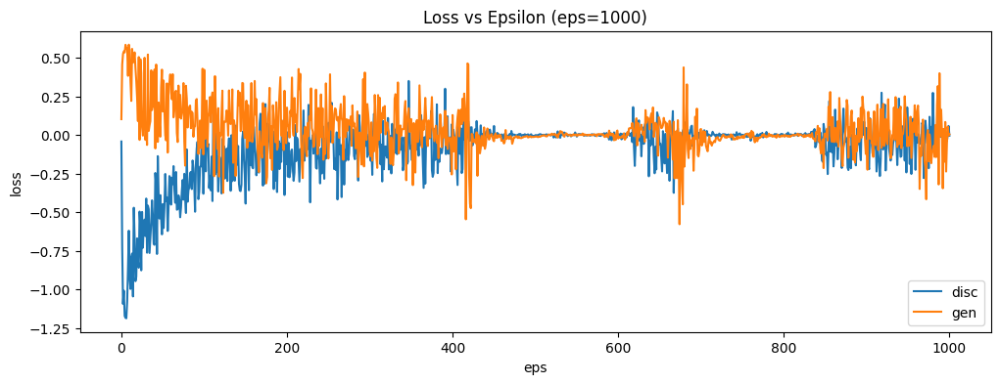

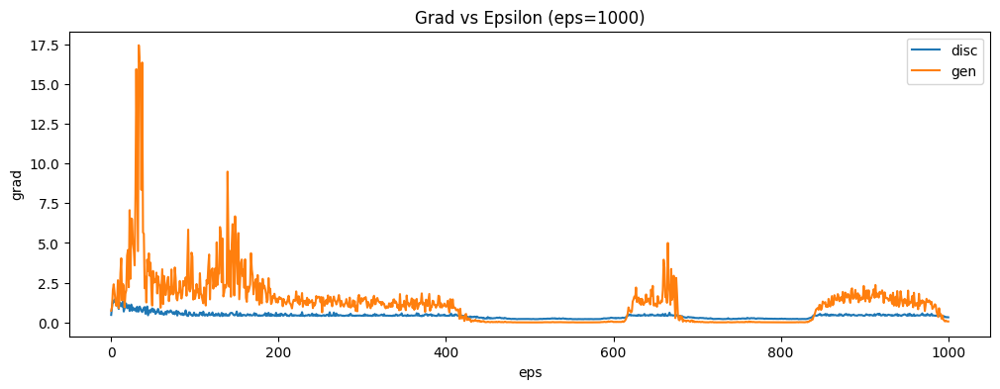

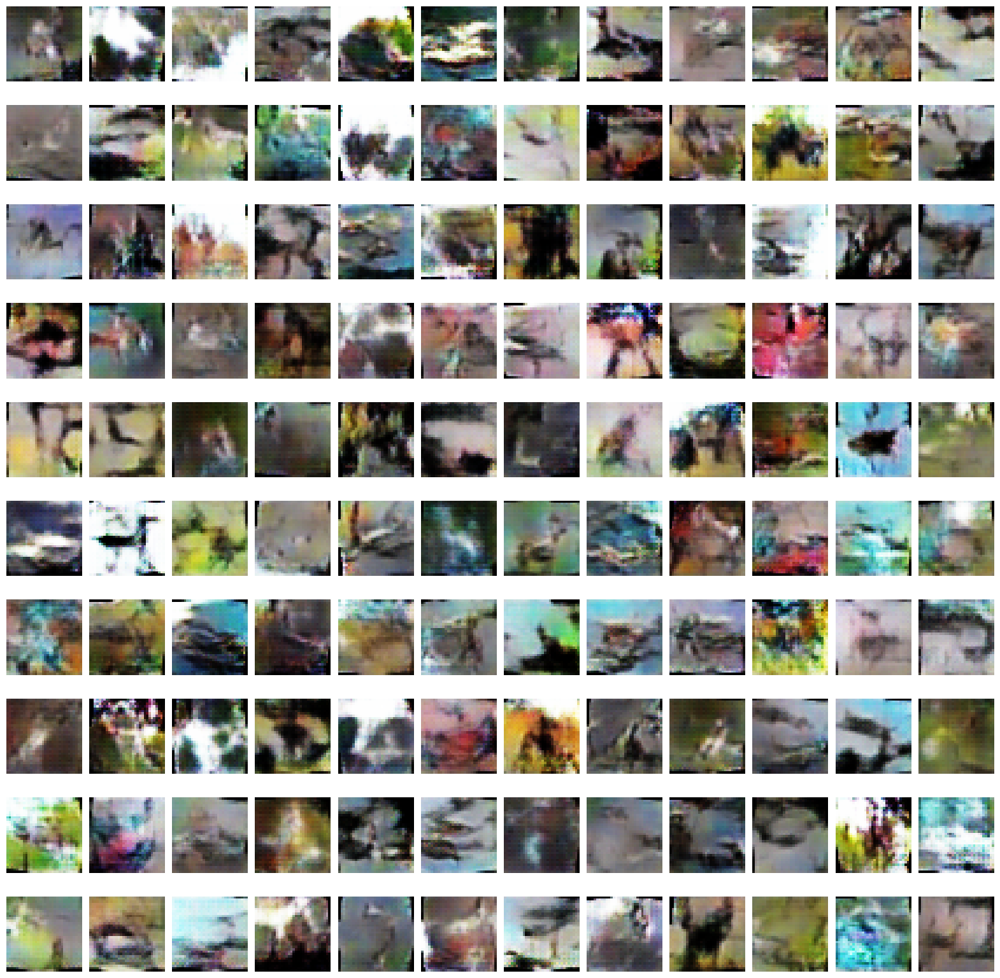

In [8]:
loss_disc_arr = []
loss_gen_arr = []
grad_disc_arr = []
grad_gen_arr = []
for i in range(epochs):

    generator.train()
    discriminator.train()
    
    for batch_idx, (real_images, _) in enumerate(train_dataloader):
        batch_size = real_images.size(0)

        real_images = real_images.to(device)

        # train discriminator
        opt_disc.zero_grad()

        # Generate fake images
        noise = torch.normal(0, 1, (batch_size, z_dim)).to(device)
        fake_images = generator(noise).detach()

        # Loss for discriminator
        loss_disc = torch.mean(discriminator(real_images)) - torch.mean(discriminator(fake_images))

        loss_disc.backward()
        opt_disc.step()

        # Clip weights of discriminator
        for p in discriminator.parameters():
            p.data.clamp_(-clip, clip)

        #  train generator
        if batch_idx % n_critic == 0:
            opt_gen.zero_grad()

            noise = torch.normal(0, 1, (batch_size, z_dim)).to(device)
            gen_images = generator(noise)
            
            # Loss for generator
            loss_gen = torch.mean(discriminator(gen_images))

            loss_gen.backward()
            opt_gen.step()

    print(f"Epoch [{i}/{epochs}] Loss D: {loss_disc:.5f}, Loss G: {loss_gen:.5f}")
    loss_disc_arr.append(loss_disc.detach().cpu().numpy().item())
    loss_gen_arr.append(loss_gen.detach().cpu().numpy().item())
    # only the grad of the last layer
    grad_disc_arr.append(discriminator.net[-1].weight.grad.norm().item())
    grad_gen_arr.append(generator.net[-2].weight.grad.norm().item())

    # Save Model
    if i % 50 == 0 and i != 0:
        print("Saving ...")
        torch.save(generator.state_dict(), 'generator_WGAN_'+str(i)+'.pth')
        torch.save(discriminator.state_dict(), 'discriminator_WGAN_'+str(i)+'.pth')
        
        # testing
        generator_test = Generator(z_dim).to(device)
        generator_test.load_state_dict(torch.load('generator_WGAN_'+str(i)+'.pth'))
        generator_test.eval()

        noise = torch.normal(0, 1, (120, z_dim)).to(device)
        images = generator_test(noise)
        images = images.permute(0, 2, 3, 1)
        images = (images + 1.0) / 2.0

        plot_losses(loss_disc_arr, loss_gen_arr, i)
        plot_grads(grad_disc_arr, grad_gen_arr, i)

        i = 0
        plt.figure(figsize=(20, 20))
        for image in images:
            plt.subplot(10,12,i+1);plt.imshow(image.detach().cpu().numpy());plt.axis("off");
            i = i + 1
        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        # plt.tight_layout()
        plt.show()